## EEG Data analysis Tutorial

```
The notebook contains the following main sections :
  1. Retrieve the experimentation data
  2. Retrieve calibration data (eyes closed - at rest state)
  3. Get sampling frequency rate (sfreq)
  4. Calculate IAF
  5. Select electrodes relavent to experiment
  6. Calculate different bands using filters
  7. Apply FFT, calculate ERD and band ratios


Main libraries used :
- mne
```

## Background

An electroencephalogram (EEG) is a recording of brain activity. <br>
The brain is the main component of the nervous system.
* It is responsible for all mental operations such as concentration, thinking, learning, and motor control.
* These capabilities are implemented through neurons.
* Our brain produces many messages to the body in the form of electrical or chemical signals.
* Electrical signals are also so called ``brain waves.``
* Neural oscillations, or brainwaves, are rhythmic or repetitive patterns of neural activity in the central nervous system.

<table><tr>
<td> <img src="https://mitsar-eeg.com/wp-content/uploads/2019/04/headset_pad_i.jpg" alt="experiment" style="width: 500px;"/> </td>
<td> <img src="https://mitsar-eeg.com/wp-content/uploads/2020/11/SmartDRY_Av_Bipolar-1024x555.png" alt="EEG Studio" style="width: 500px;"/> </td>
</tr></table>


EEG is an electrophysiological monitoring method to record electrical activity on the scalp that has been shown to represent the macroscopic activity of the surface layer of the brain underneath.

## 1. Import utils and libraries

The tools for recording and analysing EEG data. One of the most popular python library is `mne`

In [ ]:
!pip install mne
# !pip install utils
# !pip install config
# !pip install remove-outliers

In [ ]:
import pickle, mne, os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from eeg_utils import CONFIG, remove_outliers
# import config
# import remove_outliers
# import configparser

# config = configparser.ConfigParser()

## 2. Read Sample Data

Each subfolder in the Data folder represent the data for each parcitipant in the experiments. From the experiment you get a `.mdfx` file which can be exported to `.edf` file (lightweight) <br>
Each parcitipant folder has `.edf` files for full experiment with already removed artifacts, eyes closed (can be used for calibration) and eyes opened data

In [ ]:
data_path = './Data/SampleData/'

all_subjects_dirs = os.listdir(data_path)
all_subjects_dirs

['AliDjnadiEyesOpened.edf',
 'alidjnadi.edf',
 '.ipynb_checkpoints',
 'RamievTimurDay1Music',
 'SimViolettaDay1Music.zip',
 'TarasovHermanDay2Music',
 'AliDjnadiEyesClosed.edf',
 'SimViolettaDay1Music',
 'GolovinAlexanderDay2Music.zip',
 'GolovinAlexanderDay2Music',
 'RamievTimurDay1Music.zip',
 'TarasovHermanDay2Music.zip']

## 3. Defining electrodes relavent to experiment

For tasks that involves intelligence the frontal electrodes get to be of interest

<table><tr>
<td> <img src="https://qbi.uq.edu.au/files/27797/Lobes-of-the-brain-QBI.jpg" alt="Drawing" style="width: 500px;"/> </td>
<td> <img src="https://www.mayoclinic.org/-/media/kcms/gbs/patient-consumer/images/2013/11/15/17/44/ds00266_ds00810_im03440_bn7_lobesthu_jpg.png" alt="Drawing" style="width: 500px;"/> </td>
</tr></table>

In [ ]:
electrodes = {"central": ['EEG F3-Cz', 'EEG F4-Cz', 'EEG Fz-Cz', 'EEG C3-Cz', 'EEG C4-Cz', 'EEG P3-Cz', 'EEG P4-Cz',
                          'EEG Pz-Cz'],
              "frontal": ['EEG Fp1-Cz', 'EEG Fp2-Cz', 'EEG F7-Cz', 'EEG F3-Cz', 'EEG Fz-Cz', 'EEG F4-Cz', 'EEG F8-Cz'],
              "temporal": ['EEG T3-Cz', 'EEG T4-Cz', 'EEG T5-Cz', 'EEG T6-Cz']}

WAVES = ["L1A", "L2A", "UA", "Th"]

## 4. Read experimentation data

To read the raw data `mne` provides a io methods to read `.edf` files together with the metadata.

In [ ]:
raw_exp = mne.io.read_raw_edf(data_path+'alidjnadi.edf', preload=True)
sfreq = raw_exp.info['sfreq']

Extracting EDF parameters from /content/Data/SampleData/alidjnadi.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 736249  =      0.000 ...  2944.996 secs...


<ipython-input-5-12859c7c682e>:1: RuntimeWarning: Omitted 1 annotation(s) that were outside data range.
  raw_exp = mne.io.read_raw_edf(data_path+'alidjnadi.edf', preload=True)


## 5. Select the electrodes of interest

Each electrode location has a letter designating the lobe or brain region from which it reads: prefrontal (Fp), frontal (F), temporal (T), parietal (P), occipital (O) and central (C).

<table><tr>
<td> <img src="https://www.mayoclinic.org/-/media/kcms/gbs/patient-consumer/images/2013/11/15/17/44/ds00266_ds00810_im03440_bn7_lobesthu_jpg.png" alt="Drawing" style="width: 500px;"/> </td>
<td> <img src="https://www.researchgate.net/publication/324361441/figure/fig1/AS:618934365597697@1524576860370/The-10-20-International-system-of-EEG-electrode-placement.png" alt="Drawing" style="width: 500px;"/> </td>
</tr></table>

In [ ]:
# Select the electrodes of interest
experiment = raw_exp.copy().pick_channels(ch_names=electrodes["frontal"])

## Removing noise : This part can be ommited since its done with EEG studio ()
experiment_filtered_data = mne.filter.notch_filter(x=experiment.get_data(), Fs=sfreq, freqs=[50, 100])
experiment_filtered = mne.io.RawArray(data=experiment_filtered_data,
                                              info=mne.create_info(ch_names=electrodes["frontal"], sfreq=sfreq))

experiment

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 1651 samples (6.604 s)

Creating RawArray with float64 data, n_channels=7, n_times=736250
    Range : 0 ... 736249 =      0.000 ...  2944.996 secs
Ready.


<RawEDF | alidjnadi.edf, 7 x 736250 (2945.0 s), ~39.3 MB, data loaded>

## 6. Calculate the individual alpha frequency (IAF)

Here known bands:

* $1-5$ Hz: $\delta$ (delta) wave
* $4-8$ Hz: $\theta$ (theta) wave
* $8-12$ Hz: $\alpha$ (alpha) wave
* $12-25$ Hz: $\beta$ (beta) wave
* $> 25$ Hz: $\gamma$ (gamma) wave
* $7,5-12,5$ Hz: $\mu$ (mu) waves


Alpha is the dominant rhythm in the human EEG, and itsimportance for cognitive processing has been recognizedsince Hans Berger’s seminal work in the early 20th century.  Interindividual differences in the predominant frequency of alpha-band oscillations (i.e., individual alpha frequency; IAF) have been linked with variability in cognitive performance since the 1930s


**However, IAF tends to decrease with age from young adulthood onward** <br> Quantifying individual differences in the properties of the dominant alpha rhythm, IAF can also be used to derive individualized estimates of the canonical frequency bands beyond the alpha range.
There are many ways suggested to calculate the IAF but we use the simplest.

$$IAF=11.95 - 0.053 * Age$$

In [ ]:
# Function to calculate IAF
def IAF(age):
    return 11.95 - 0.053 * age

In [ ]:
IAF_p = IAF(CONFIG["subjects"]['subject1'])
IAF_p = IAF(CONFIG["subjects"]['subject1'])

## 7. Calculate different bands using filters

Based on the IAF the calculation of sub-bands get to be i.e:

* $\theta = [IAF - 6; IAF - 4]$
* $L1\alpha = [IAF - 4; IAF - 2]$
* $L2\alpha = [IAF - 2; IAF]$
* $U\alpha = [IAF; IAF + 2]$

Using `mne.filter.filter_data(...)` the sub bands intervals can be specified

In [ ]:
experiment_sub_bands = {'L1A': mne.filter.filter_data(data=np.mean(experiment_filtered.get_data(), axis=0),
                                                              l_freq=IAF_p - 4, h_freq=IAF_p - 2, sfreq=sfreq,
                                                              method="fir", verbose=False),
                                'L2A': mne.filter.filter_data(data=np.mean(experiment_filtered.get_data(), axis=0),
                                                              l_freq=IAF_p - 2, h_freq=IAF_p, sfreq=sfreq,
                                                              method="fir", verbose=False),
                                'UA': mne.filter.filter_data(data=np.mean(experiment_filtered.get_data(), axis=0),
                                                             l_freq=IAF_p,
                                                             h_freq=IAF_p + 2, sfreq=sfreq, method="fir", verbose=False),
                                'Th': mne.filter.filter_data(data=np.mean(experiment_filtered.get_data(), axis=0),
                                                             l_freq=IAF_p - 6, h_freq=IAF_p - 4, sfreq=sfreq,
                                                             method="fir", verbose=False),
                                'Beta': mne.filter.filter_data(data=np.mean(experiment_filtered.get_data(), axis=0),
                                                               l_freq=IAF_p + 2, h_freq=30, sfreq=sfreq,
                                                               method="fir", verbose=False)}

In [ ]:
experiment_sub_bands

{'L1A': array([-5.11528491e-21, -1.53516879e-06, -3.02290663e-06, ...,
        -9.56140169e-08, -4.79787676e-08,  2.64697796e-22]),
 'L2A': array([-3.17637355e-22, -1.12254956e-06, -2.18860342e-06, ...,
         1.63433717e-08,  8.29840972e-09,  3.17637355e-22]),
 'UA': array([-2.64697796e-21, -1.32975802e-06, -2.53811450e-06, ...,
        -8.94183107e-09, -4.71063608e-09, -2.19699171e-21]),
 'Th': array([-4.44692297e-21, -1.89028858e-06, -3.74793209e-06, ...,
         7.69284352e-08,  3.82221537e-08, -1.00585162e-21]),
 'Beta': array([ 6.35274710e-21, -8.86698752e-06, -1.46367432e-05, ...,
         5.82957573e-11,  5.04794610e-11,  3.63959470e-22])}

## 8. Apply FFT, calculate ERD and band ratios

Transform the data from time domain to frequency domain
1. Determine the window size as sfreq * 2

Event-related desynchronization (ERD) reflects a decrease of oscillatory activity related to internally or externally paced events. The increase of rhythmic activity is called event-related synchronization (ERS). They represent the dynamical states of thalamocortical networks associated with cortical information processing changes.

As a result, more time-consuming work should result in a larger ERD difference between rest and programming periods. ERD is calculated using the formula shown below:
\begin{equation}
    ERD=\frac{{amplitude}_{rest}-{amplitude}_{programming}}{{amplitude}_{programming}}*100\%
\end{equation}

The Fast Fourier Transform (FFT) converts the data from time domain to frequency domain (amplitude)

In [ ]:
# Function to calculate ERD
def erd_calculation(amp_rest, amp_task):
    erd = (amp_rest - amp_task) / amp_task * 100
    return erd

In [ ]:
fft = {}
from scipy.signal import stft
window = sfreq * 2

for band in WAVES:
    fft[band] = stft(x=experiment_sub_bands[band], fs=sfreq, window=('kaiser', window), nperseg=1000)

erd_calc = np.vectorize(erd_calculation)

## 8.1 Calculate Alpha/Beta ratio (indication of stress levels)

In [ ]:
results = {}
results["ABratio"] = remove_outliers(np.real(np.power(experiment_sub_bands["UA"] / experiment_sub_bands["Beta"], 2)))
results

{'ABratio': array([0.17361111, 0.56811057, 0.56811057, ..., 0.56811057, 0.56811057,
        0.56811057])}

## 9. Whats next??
* Correlation
* hypothesis testing and other statistical tests
* pattern recognition
* ...



## Resources
1. [EEG alpha and theta oscillations reflect cognitive and memory performance: a review and analysis](http://www.math.tau.ac.il/~nin/Courses/Seminar14a/EEG_AlphaTheta1999.pdf)
2. [Toward a reliable, automated method of individual alpha frequency (IAF) quantification](https://www.researchgate.net/publication/322640939_Toward_a_reliable_automated_method_of_individual_alpha_frequency_IAF_quantification)
3. [Age trends and sex differences of alpha rhythms including split alpha peaks](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.976.6063&rep=rep1&type=pdf)

Opening raw data file ./Data/SampleData/TarasovHermanDay2Music/Task1_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 16)  idle
    Range : 0 ... 59249 =      0.000 ...   236.996 secs
Ready.
<Raw | Task1_Processed_raw.fif, 17 x 59250 (237.0 s), ~35 kB, data not loaded>
<Info | 11 non-empty values
 bads: 1 items (event)
 ch_names: EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG F4-Cz, EEG ...
 chs: 17 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-11 12:58:06 UTC
 meas_id: 4 items (dict)
 nchan: 17
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfreq: 250.0 Hz
>
Effective w

<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


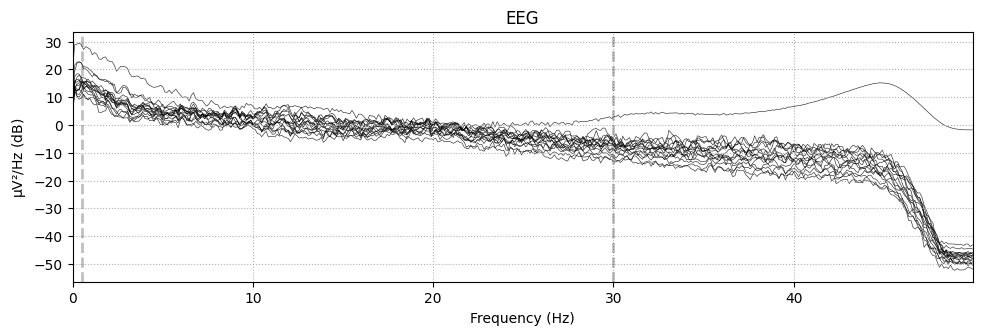

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 143 (\x8f) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 147 (\x93) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


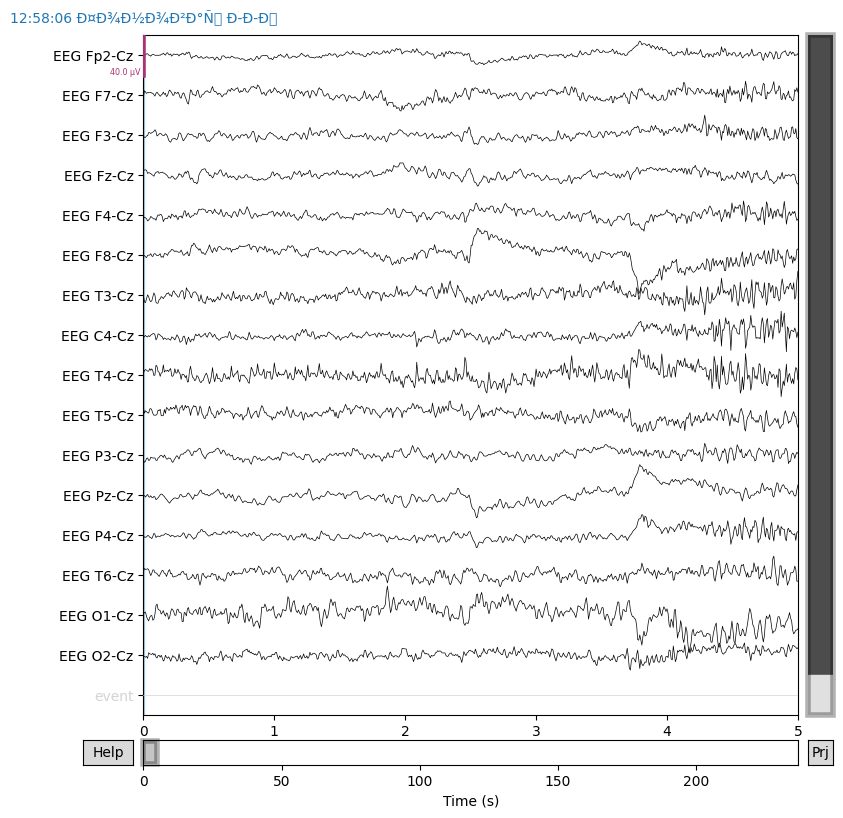

Opening raw data file ./Data/SampleData/TarasovHermanDay2Music/Task2_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 16)  idle
    Range : 0 ... 46999 =      0.000 ...   187.996 secs
Ready.
<Raw | Task2_Processed_raw.fif, 17 x 47000 (188.0 s), ~35 kB, data not loaded>
<Info | 11 non-empty values
 bads: 1 items (event)
 ch_names: EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG F4-Cz, EEG ...
 chs: 17 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-11 13:02:31 UTC
 meas_id: 4 items (dict)
 nchan: 17
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfreq: 250.0 Hz
>
Effective w

<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


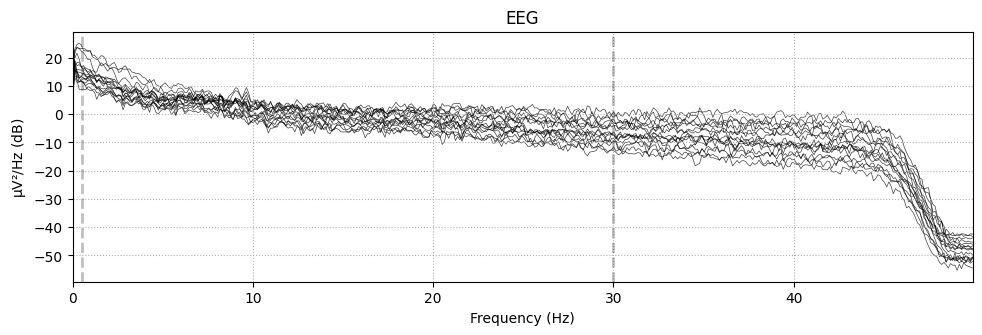

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 143 (\x8f) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 147 (\x93) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


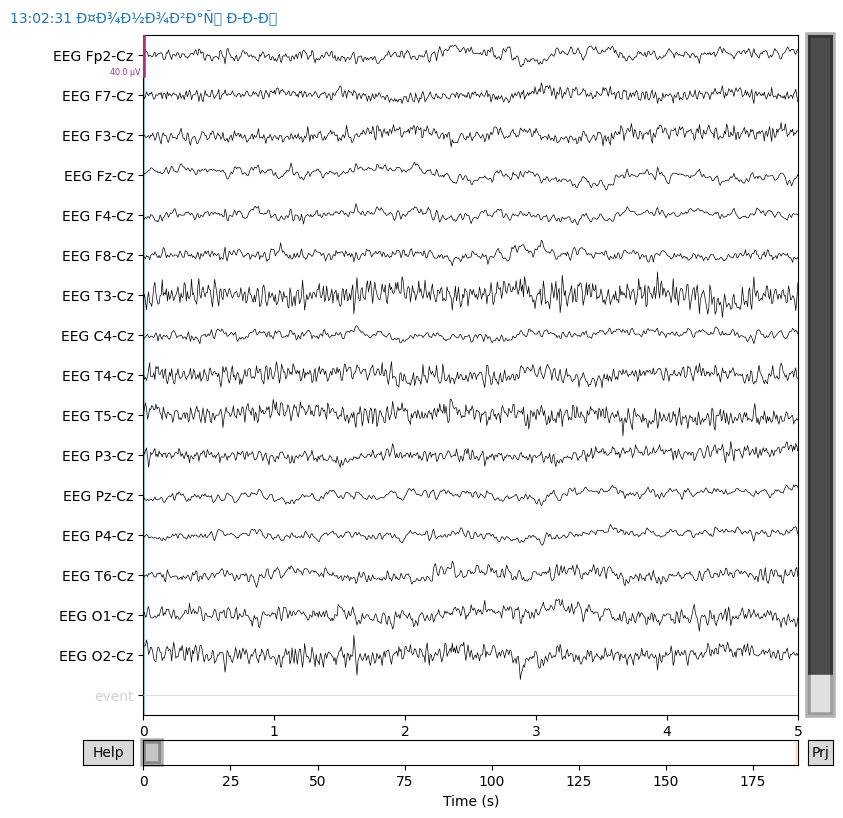

Opening raw data file ./Data/SampleData/TarasovHermanDay2Music/Task3_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 15)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 15)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 15)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 15)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 15)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 15)  idle
    Range : 0 ... 55749 =      0.000 ...   222.996 secs
Ready.
<Raw | Task3_Processed_raw.fif, 17 x 55750 (223.0 s), ~34 kB, data not loaded>
<Info | 11 non-empty values
 bads: 2 items (EEG O2-Cz, event)
 ch_names: EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG F4-Cz, EEG ...
 chs: 17 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-11 13:05:55 UTC
 meas_id: 4 items (dict)
 nchan: 17
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfreq: 250.0 Hz
>


<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


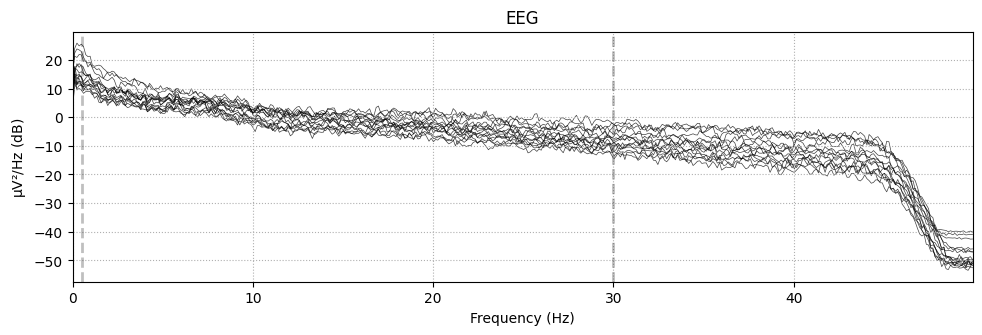

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 143 (\x8f) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 147 (\x93) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


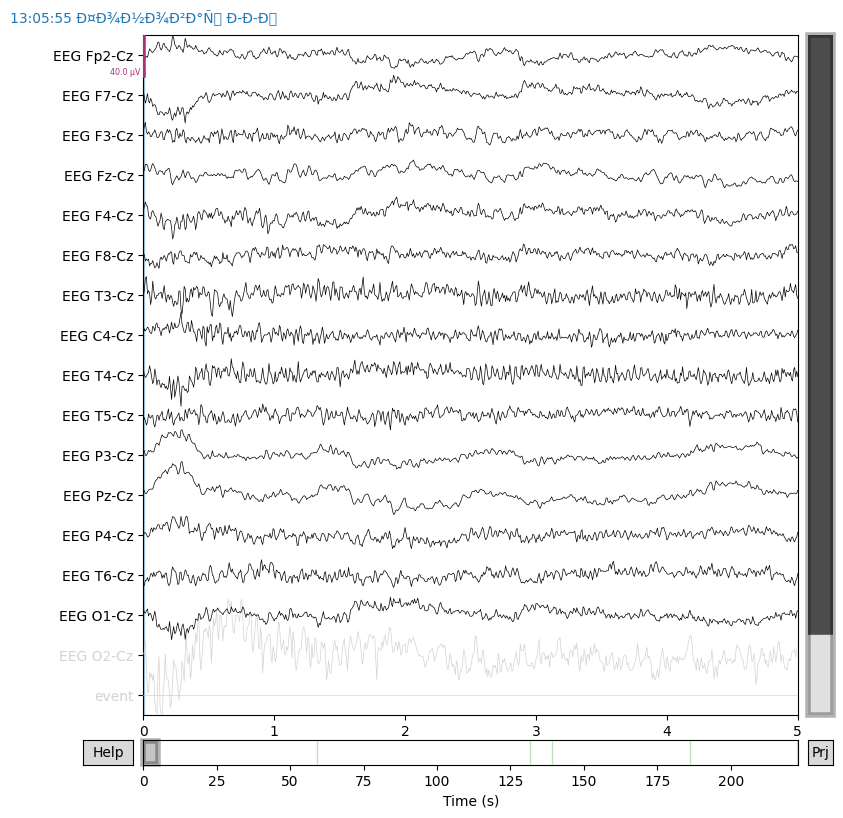

Opening raw data file ./Data/SampleData/TarasovHermanDay2Music/Task4_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 16)  idle
    Range : 0 ... 71999 =      0.000 ...   287.996 secs
Ready.
<Raw | Task4_Processed_raw.fif, 17 x 72000 (288.0 s), ~35 kB, data not loaded>
<Info | 11 non-empty values
 bads: 1 items (event)
 ch_names: EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG F4-Cz, EEG ...
 chs: 17 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-11 13:10:49 UTC
 meas_id: 4 items (dict)
 nchan: 17
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfreq: 250.0 Hz
>
Effective w

<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


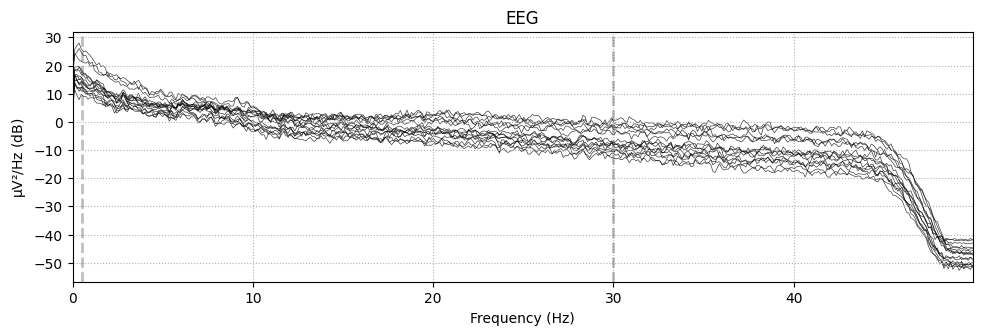

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 143 (\x8f) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 147 (\x93) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


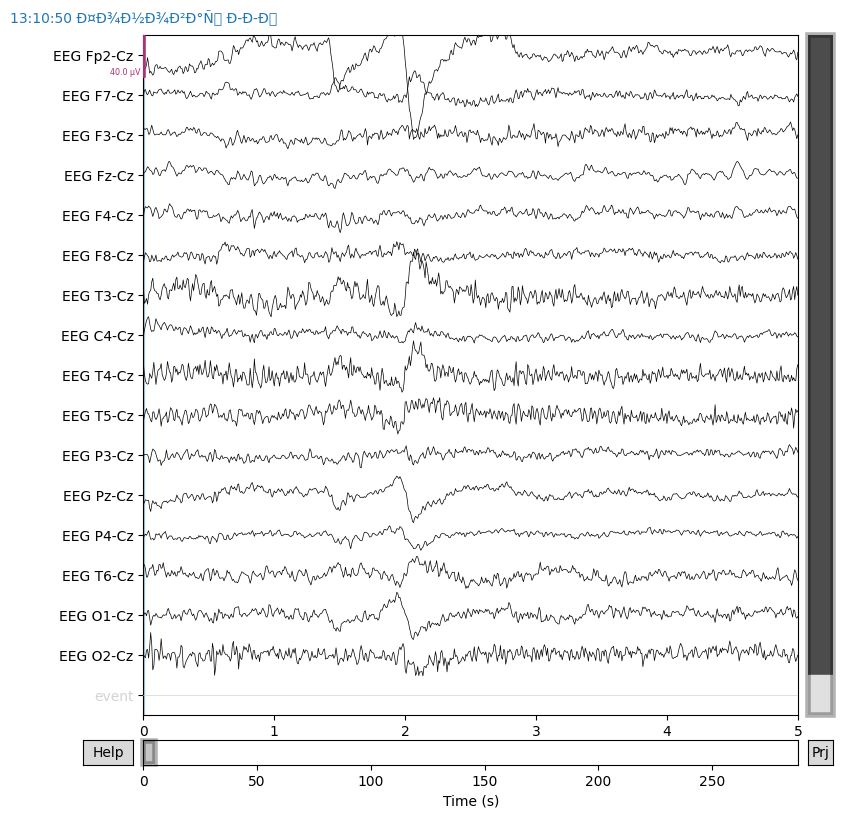

Opening raw data file ./Data/SampleData/SimViolettaDay1Music/Task1_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 16)  idle
    Range : 0 ... 54499 =      0.000 ...   217.996 secs
Ready.
<Raw | Task1_Processed_raw.fif, 19 x 54500 (218.0 s), ~37 kB, data not loaded>
<Info | 11 non-empty values
 bads: 3 items (EEG Fp1-Cz, EEG Fp2-Cz, event)
 ch_names: EEG Fp1-Cz, EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG ...
 chs: 19 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-09 12:45:47 UTC
 meas_id: 4 items (dict)
 nchan: 19
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfreq:

<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


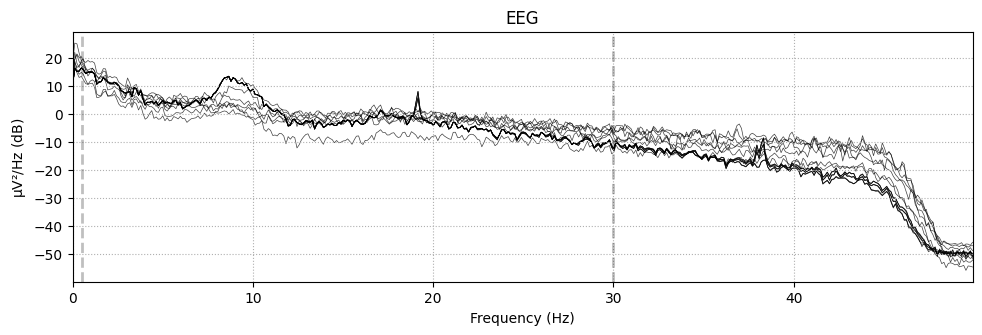

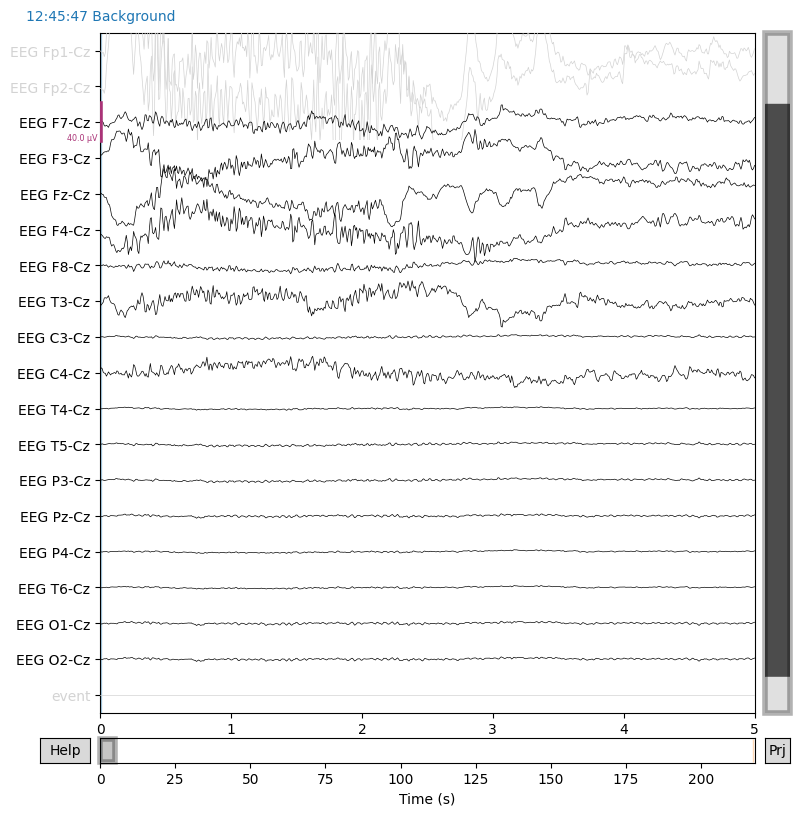

Opening raw data file ./Data/SampleData/SimViolettaDay1Music/Task2_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 18)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 18)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 18)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 18)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 18)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 18)  idle
    Range : 0 ... 110749 =      0.000 ...   442.996 secs
Ready.
<Raw | Task2_Processed_raw.fif, 19 x 110750 (443.0 s), ~38 kB, data not loaded>
<Info | 11 non-empty values
 bads: 1 items (event)
 ch_names: EEG Fp1-Cz, EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG ...
 chs: 19 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-09 12:50:09 UTC
 meas_id: 4 items (dict)
 nchan: 19
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfreq: 250.0 Hz
>
Effective 

<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


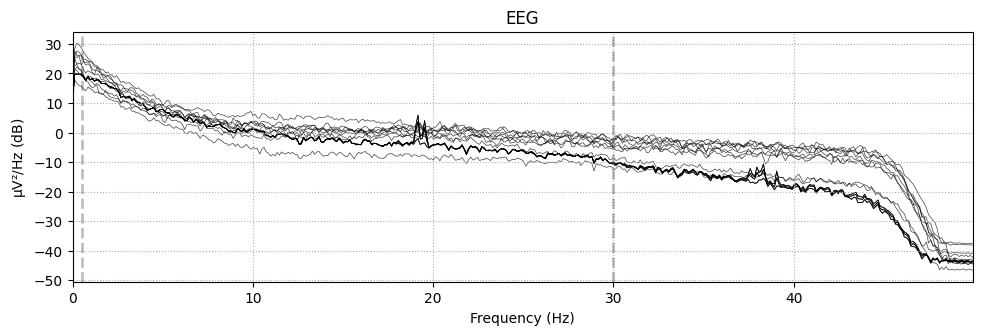

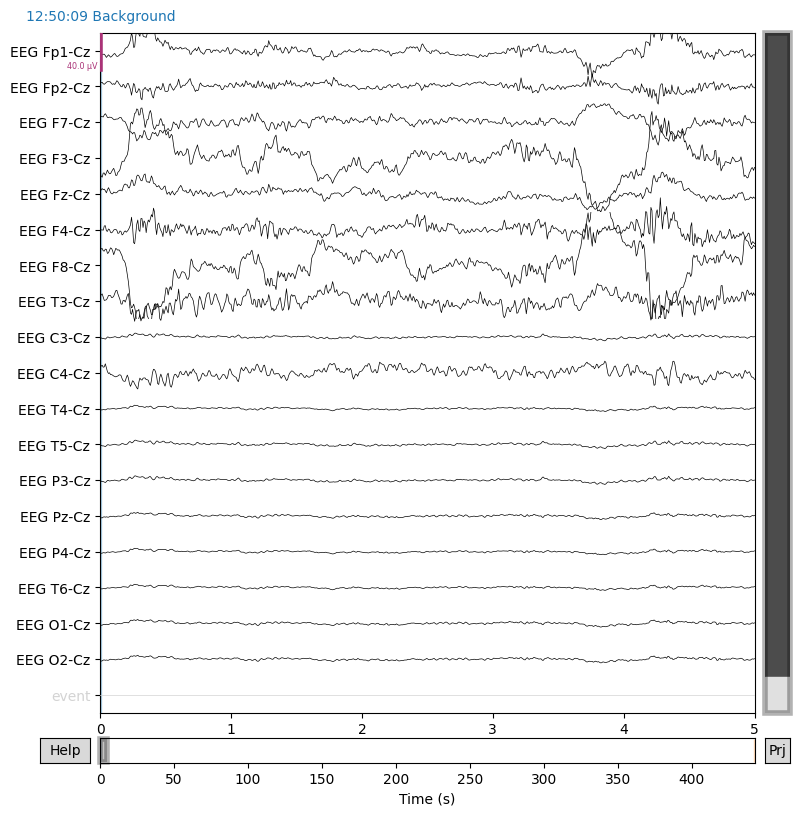

Opening raw data file ./Data/SampleData/SimViolettaDay1Music/Task3_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 18)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 18)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 18)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 18)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 18)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 18)  idle
    Range : 0 ... 91499 =      0.000 ...   365.996 secs
Ready.
<Raw | Task3_Processed_raw.fif, 19 x 91500 (366.0 s), ~38 kB, data not loaded>
<Info | 11 non-empty values
 bads: 1 items (event)
 ch_names: EEG Fp1-Cz, EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG ...
 chs: 19 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-09 13:00:00 UTC
 meas_id: 4 items (dict)
 nchan: 19
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfreq: 250.0 Hz
>
Effective wi

<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


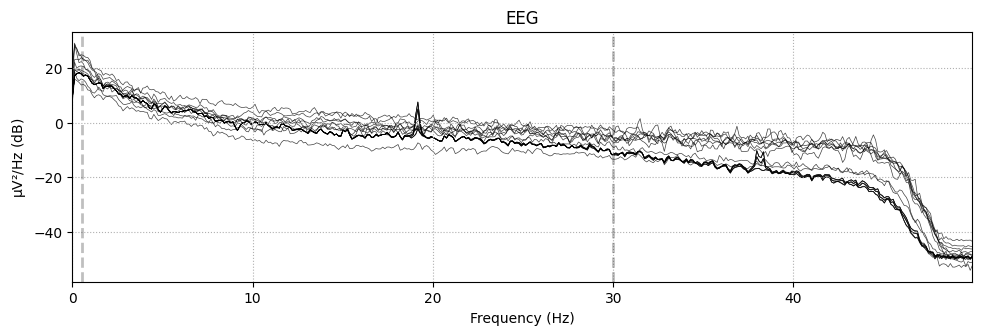

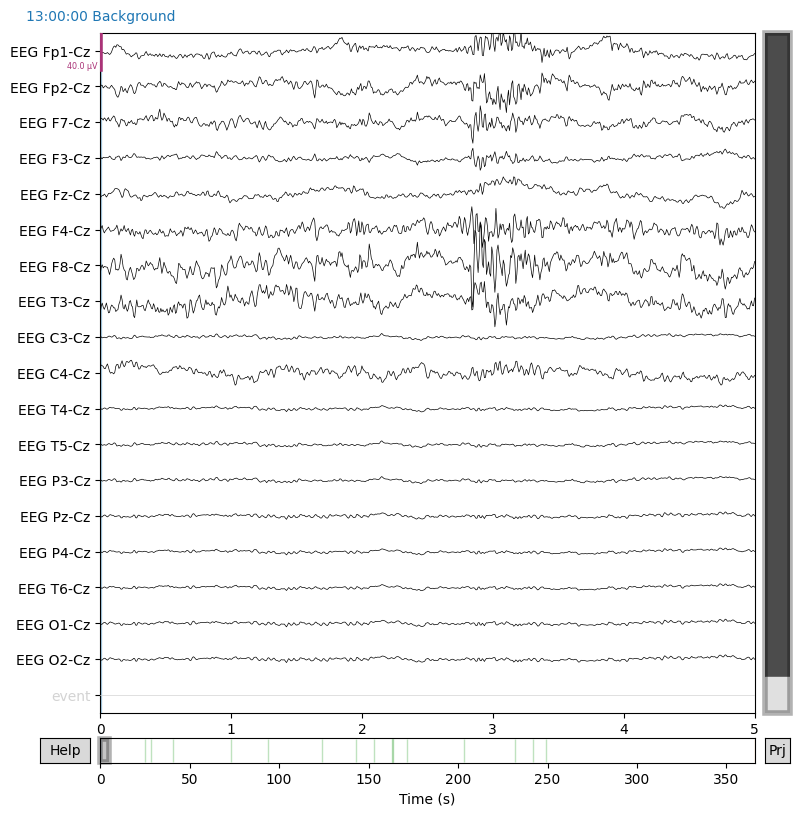

Opening raw data file ./Data/SampleData/SimViolettaDay1Music/Task4_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 18)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 18)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 18)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 18)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 18)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 18)  idle
    Range : 0 ... 85499 =      0.000 ...   341.996 secs
Ready.
<Raw | Task4_Processed_raw.fif, 19 x 85500 (342.0 s), ~38 kB, data not loaded>
<Info | 11 non-empty values
 bads: 1 items (event)
 ch_names: EEG Fp1-Cz, EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG ...
 chs: 19 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-09 13:06:40 UTC
 meas_id: 4 items (dict)
 nchan: 19
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfreq: 250.0 Hz
>
Effective wi

<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


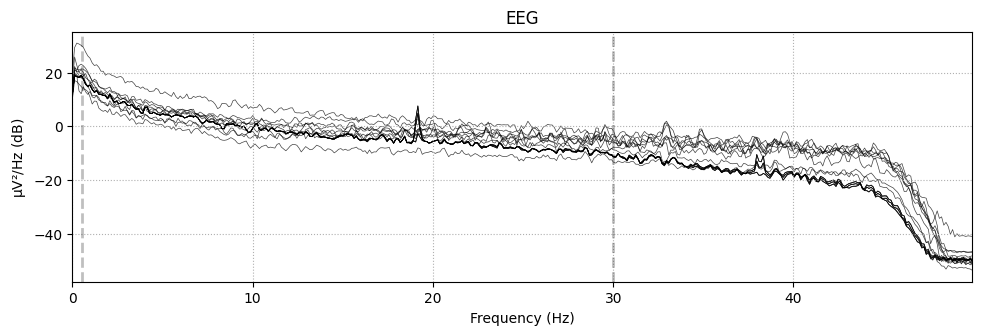

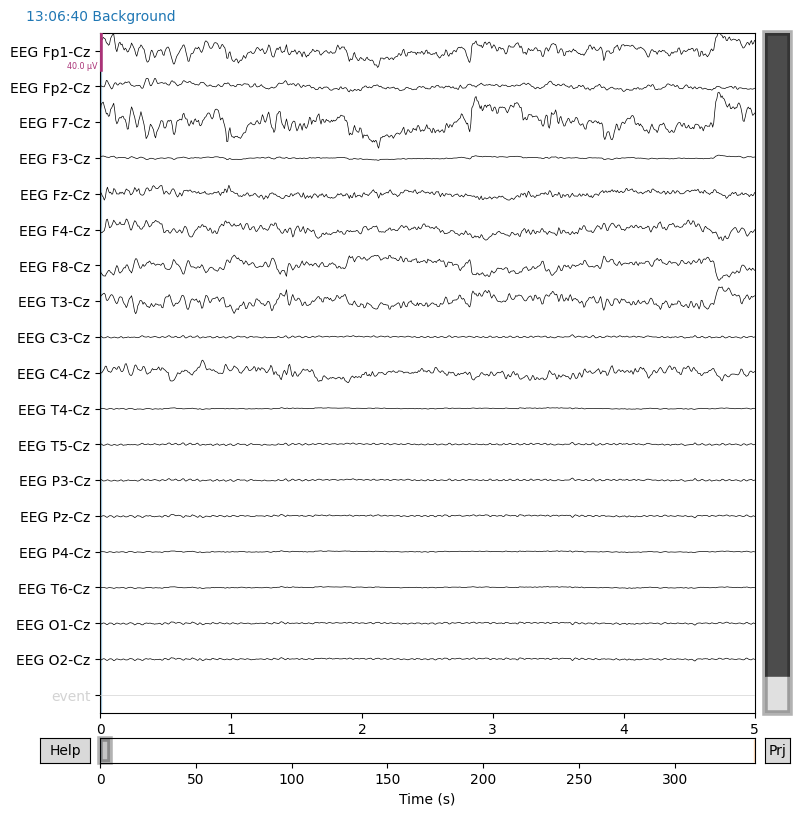

Opening raw data file ./Data/SampleData/RamievTimurDay1Music/Task1_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 16)  idle
    Range : 0 ... 81999 =      0.000 ...   327.996 secs
Ready.
<Raw | Task1_Processed_raw.fif, 18 x 82000 (328.0 s), ~36 kB, data not loaded>
<Info | 11 non-empty values
 bads: 2 items (EEG Fp1-Cz, event)
 ch_names: EEG Fp1-Cz, EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG ...
 chs: 18 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-09 11:43:06 UTC
 meas_id: 4 items (dict)
 nchan: 18
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfreq: 250.0 Hz
>


<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


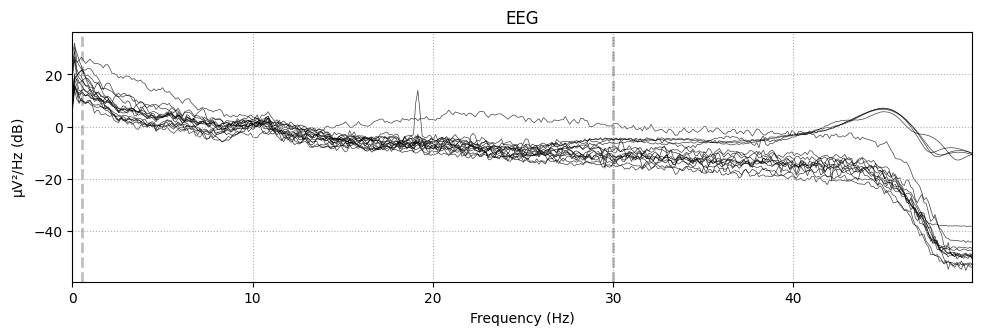

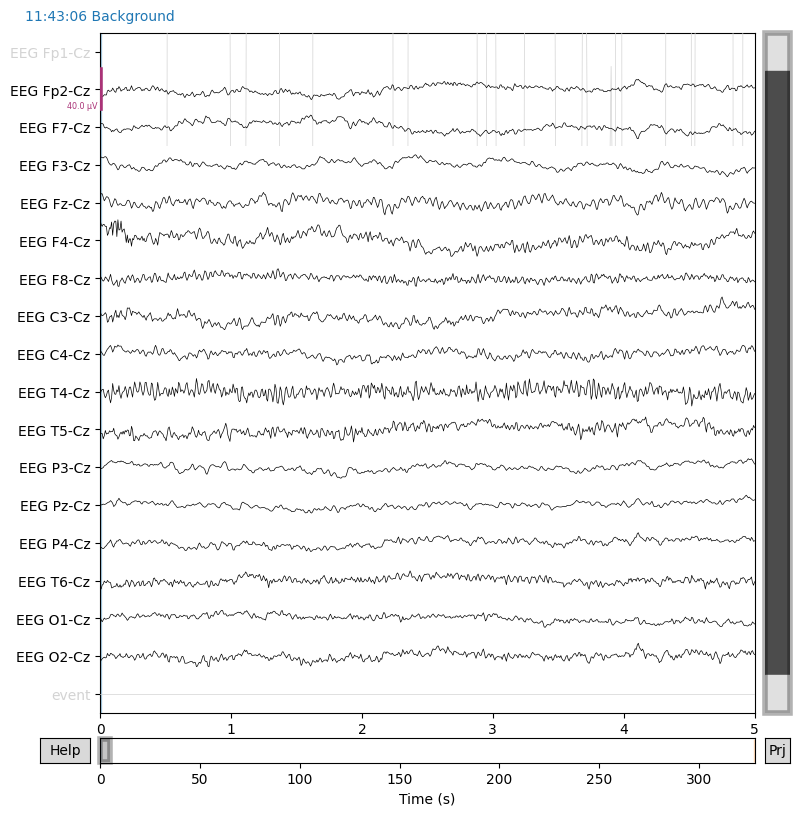

Opening raw data file ./Data/SampleData/RamievTimurDay1Music/Task2_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 16)  idle
    Range : 0 ... 68749 =      0.000 ...   274.996 secs
Ready.
<Raw | Task2_Processed_raw.fif, 18 x 68750 (275.0 s), ~36 kB, data not loaded>
<Info | 11 non-empty values
 bads: 2 items (EEG Fp2-Cz, event)
 ch_names: EEG Fp1-Cz, EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG ...
 chs: 18 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-09 11:50:34 UTC
 meas_id: 4 items (dict)
 nchan: 18
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfreq: 250.0 Hz
>


<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


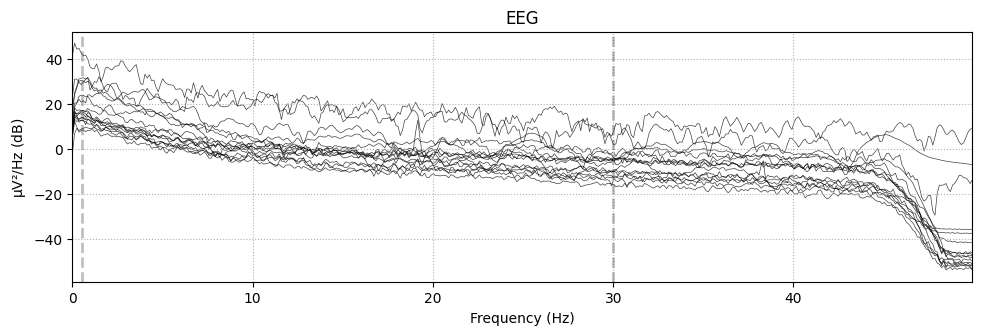

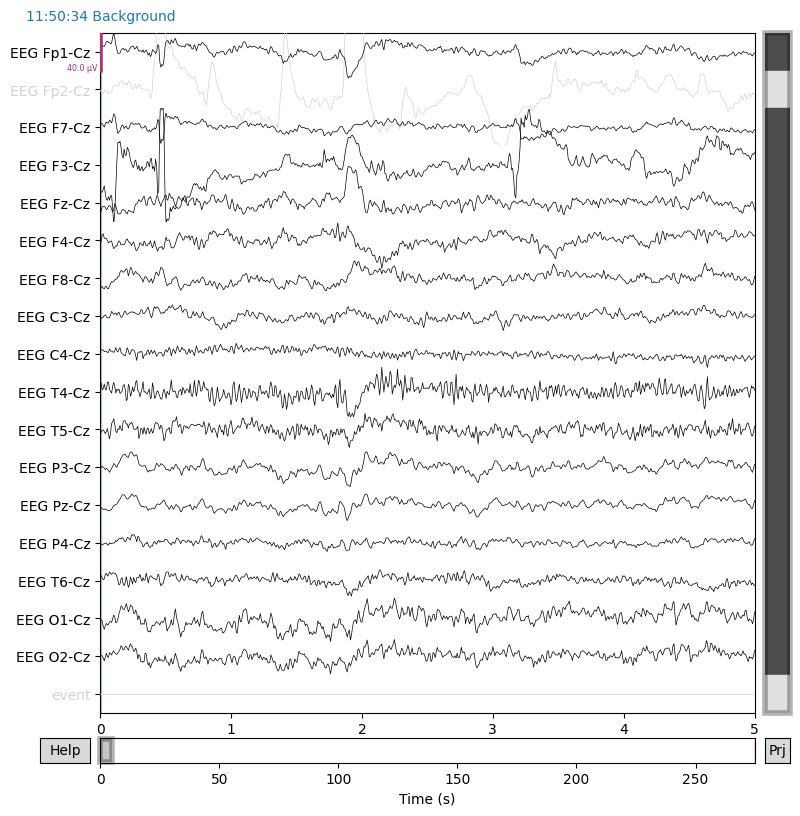

Opening raw data file ./Data/SampleData/RamievTimurDay1Music/Task3_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 16)  idle
    Range : 0 ... 80749 =      0.000 ...   322.996 secs
Ready.
<Raw | Task3_Processed_raw.fif, 18 x 80750 (323.0 s), ~36 kB, data not loaded>
<Info | 11 non-empty values
 bads: 2 items (EEG Fp1-Cz, event)
 ch_names: EEG Fp1-Cz, EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG ...
 chs: 18 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-09 11:59:15 UTC
 meas_id: 4 items (dict)
 nchan: 18
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfreq: 250.0 Hz
>


<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


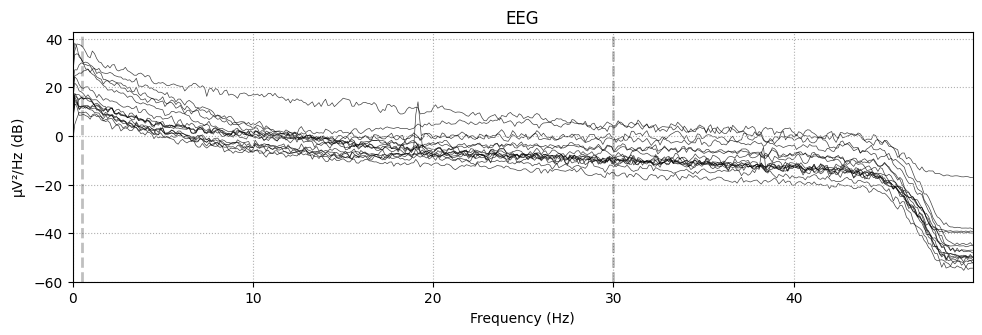

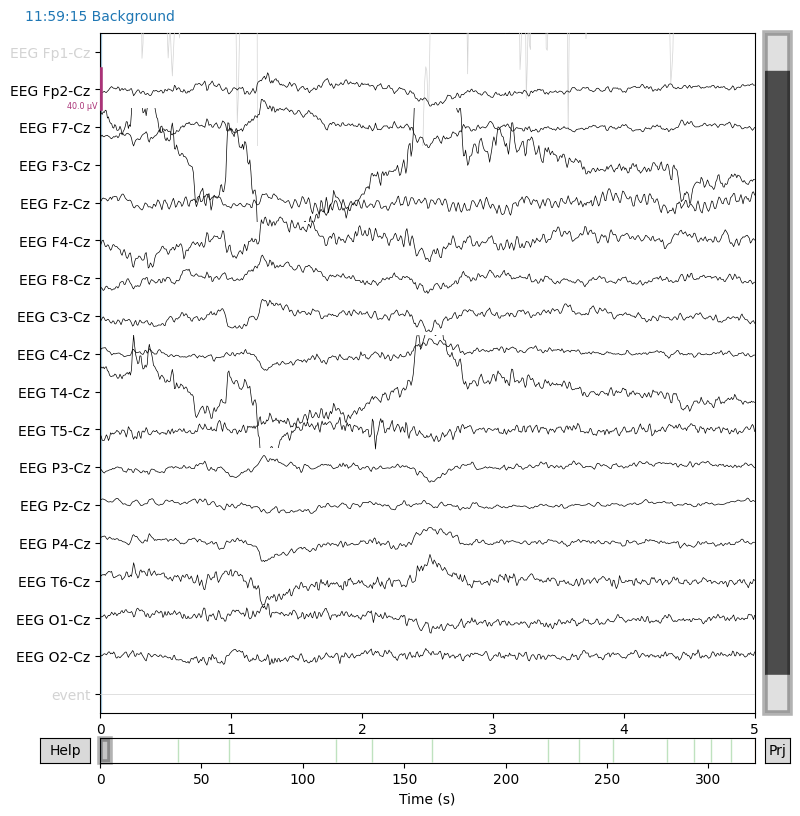

Opening raw data file ./Data/SampleData/RamievTimurDay1Music/Task4_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 16)  idle
    Range : 0 ... 75499 =      0.000 ...   301.996 secs
Ready.
<Raw | Task4_Processed_raw.fif, 18 x 75500 (302.0 s), ~36 kB, data not loaded>
<Info | 11 non-empty values
 bads: 2 items (EEG Fp1-Cz, event)
 ch_names: EEG Fp1-Cz, EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG ...
 chs: 18 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-09 12:08:04 UTC
 meas_id: 4 items (dict)
 nchan: 18
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfreq: 250.0 Hz
>


<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


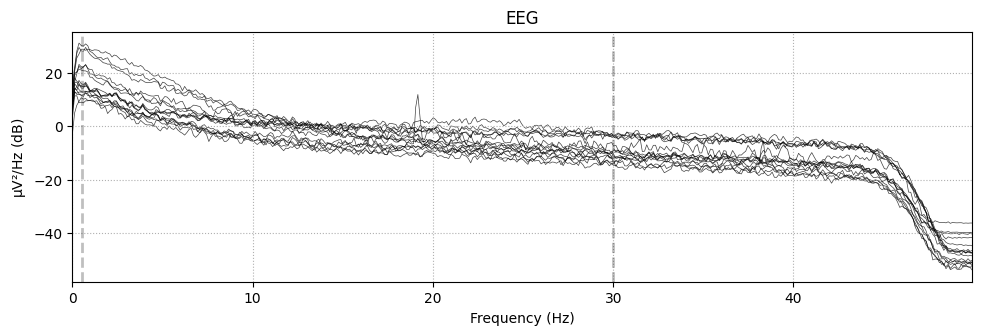

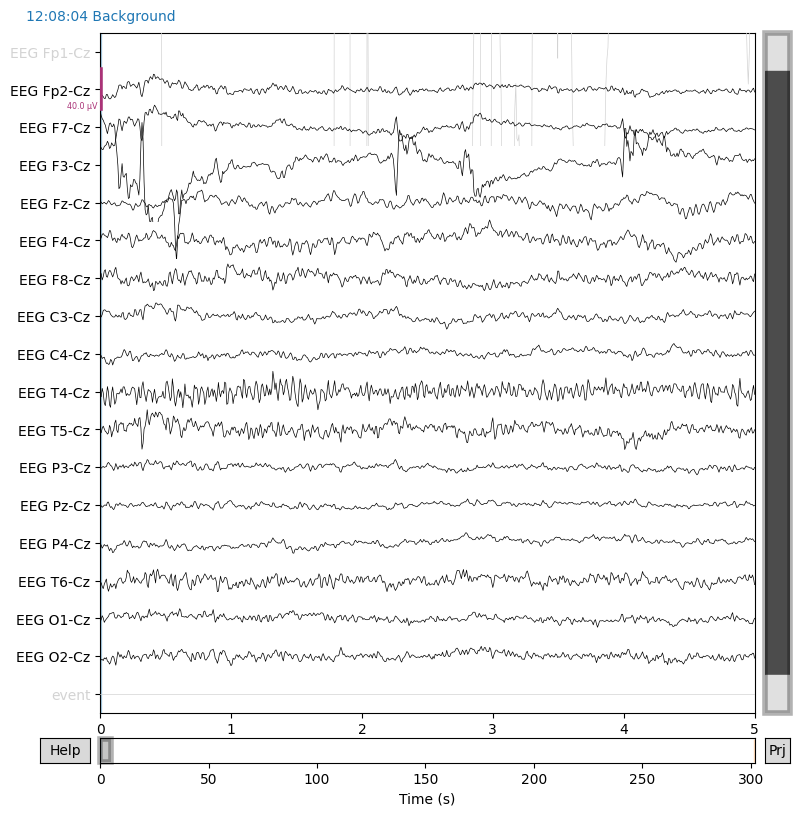

Opening raw data file ./Data/SampleData/GolovinAlexanderDay2Music/Task1_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 16)  idle
    Range : 0 ... 61999 =      0.000 ...   247.996 secs
Ready.
<Raw | Task1_Processed_raw.fif, 19 x 62000 (248.0 s), ~37 kB, data not loaded>
<Info | 11 non-empty values
 bads: 3 items (EEG T3-Cz, EEG T4-Cz, event)
 ch_names: EEG Fp1-Cz, EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG ...
 chs: 19 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-11 11:24:12 UTC
 meas_id: 4 items (dict)
 nchan: 19
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfr

<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


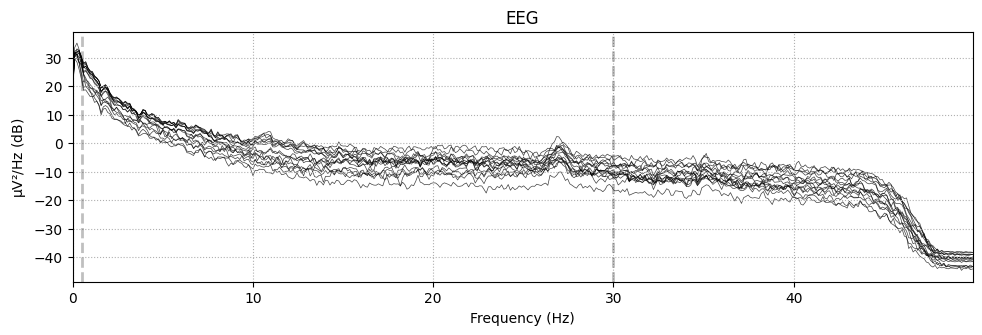

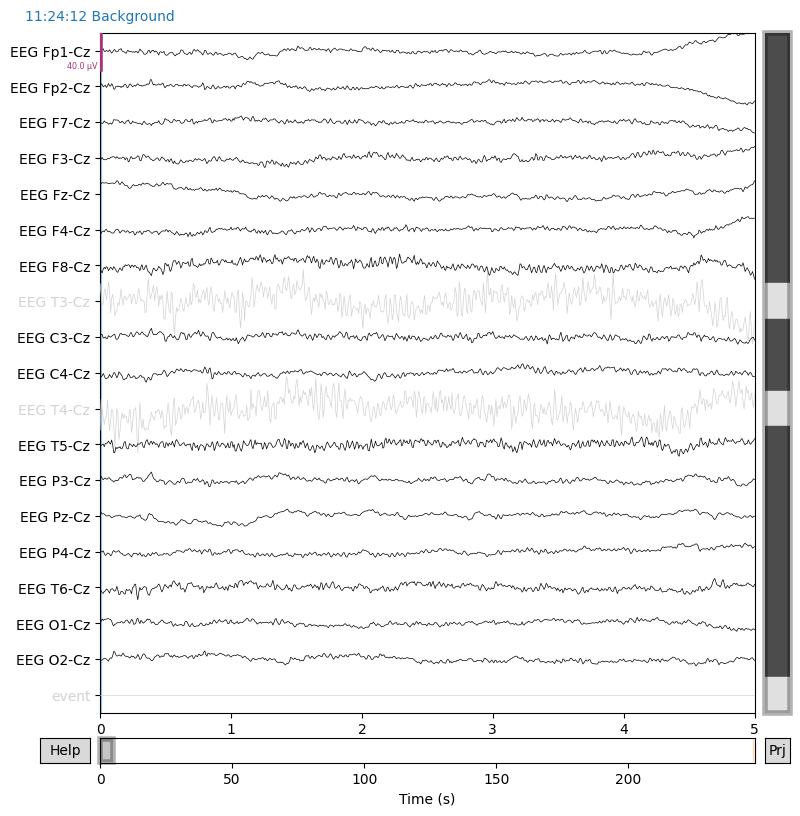

Opening raw data file ./Data/SampleData/GolovinAlexanderDay2Music/Task2_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 16)  idle
    Range : 0 ... 121499 =      0.000 ...   485.996 secs
Ready.
<Raw | Task2_Processed_raw.fif, 19 x 121500 (486.0 s), ~37 kB, data not loaded>
<Info | 11 non-empty values
 bads: 3 items (EEG T3-Cz, EEG T4-Cz, event)
 ch_names: EEG Fp1-Cz, EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG ...
 chs: 19 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-11 11:31:02 UTC
 meas_id: 4 items (dict)
 nchan: 19
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 s

<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


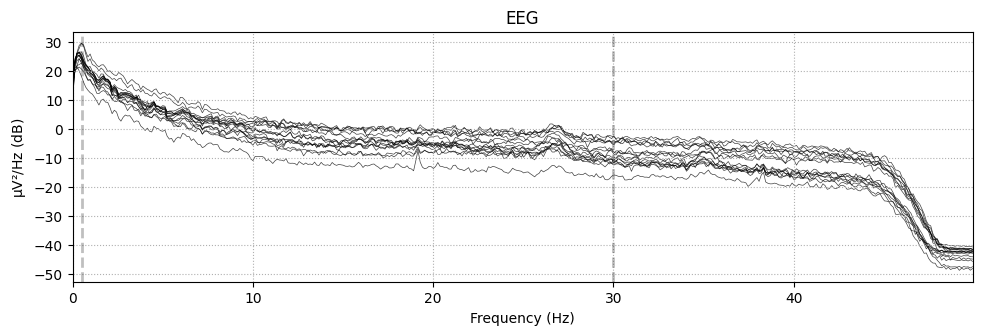

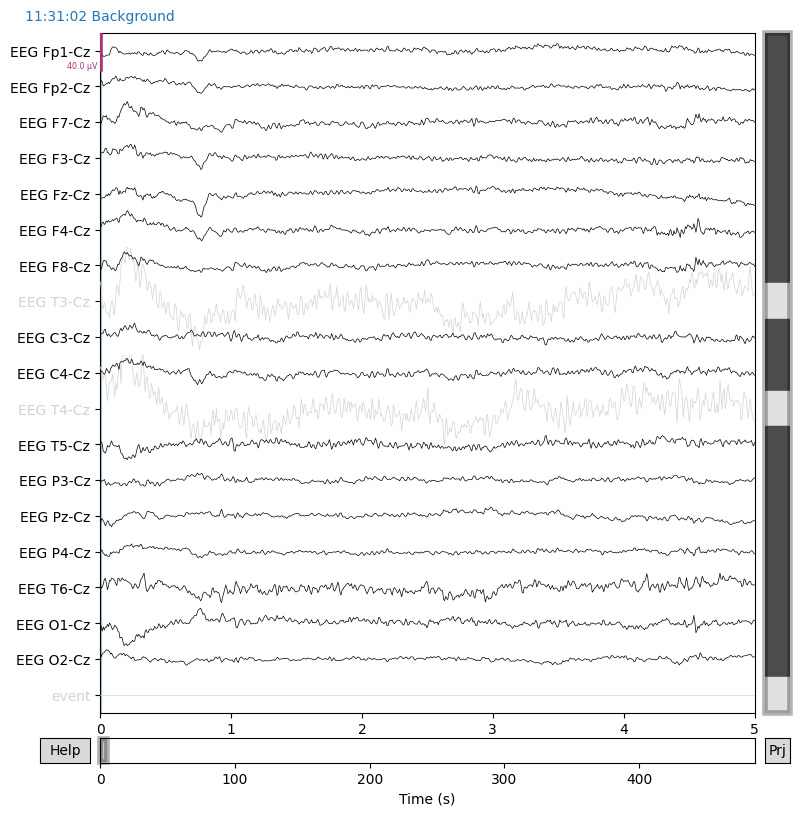

Opening raw data file ./Data/SampleData/GolovinAlexanderDay2Music/Task3_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 16)  idle
    Range : 0 ... 72499 =      0.000 ...   289.996 secs
Ready.
<Raw | Task3_Processed_raw.fif, 19 x 72500 (290.0 s), ~37 kB, data not loaded>
<Info | 11 non-empty values
 bads: 3 items (EEG T3-Cz, EEG T4-Cz, event)
 ch_names: EEG Fp1-Cz, EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG ...
 chs: 19 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-11 11:44:35 UTC
 meas_id: 4 items (dict)
 nchan: 19
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 sfr

<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


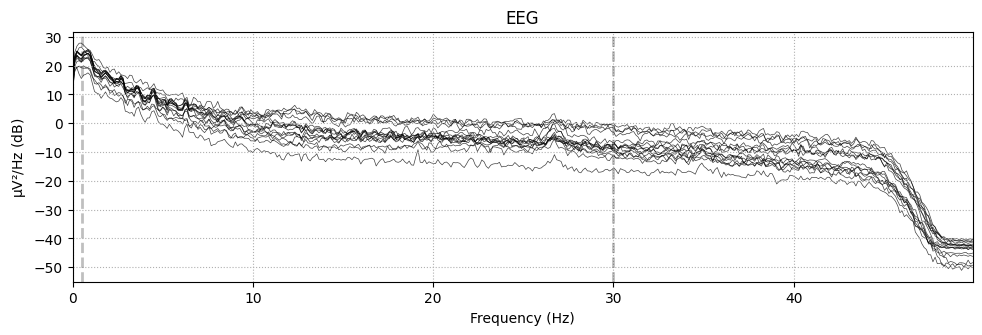

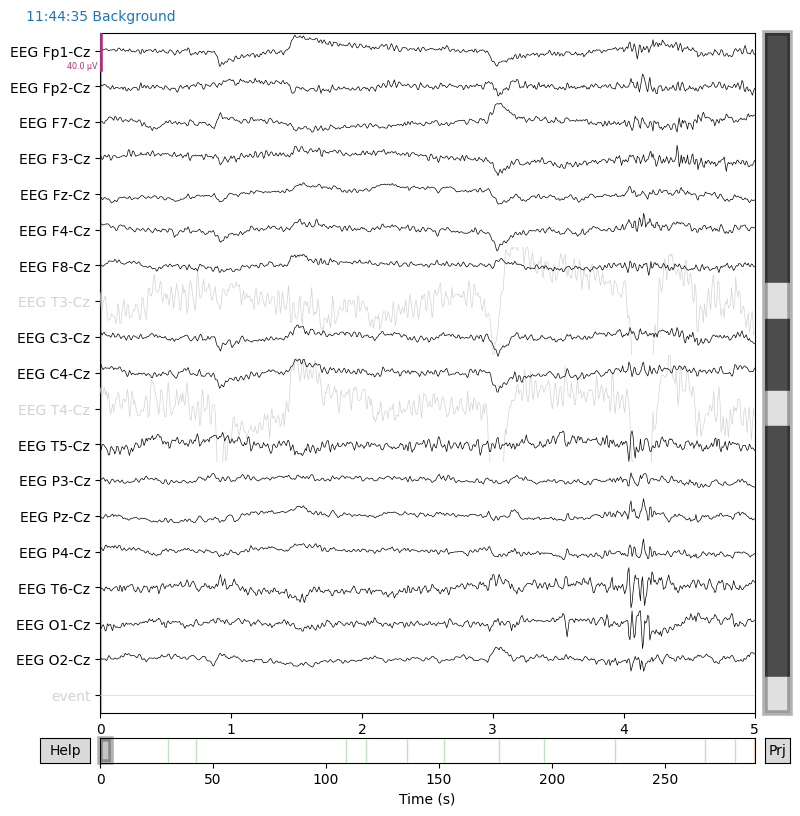

Opening raw data file ./Data/SampleData/GolovinAlexanderDay2Music/Task4_Processed_raw.fif...
Isotrak not found
    Read a total of 6 projection items:
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-01 (1 x 16)  idle
        ECG-eeg--0.200-0.400-PCA-02 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-01 (1 x 16)  idle
        EOG-eeg--0.200-0.200-PCA-02 (1 x 16)  idle
    Range : 0 ... 122499 =      0.000 ...   489.996 secs
Ready.
<Raw | Task4_Processed_raw.fif, 19 x 122500 (490.0 s), ~37 kB, data not loaded>
<Info | 11 non-empty values
 bads: 3 items (EEG T3-Cz, EEG T4-Cz, event)
 ch_names: EEG Fp1-Cz, EEG Fp2-Cz, EEG F7-Cz, EEG F3-Cz, EEG Fz-Cz, EEG ...
 chs: 19 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2021-06-11 11:55:08 UTC
 meas_id: 4 items (dict)
 nchan: 19
 projs: ECG-eeg--0.200-0.400-PCA-01: off, ECG-eeg--0.200-0.400-PCA-02: ...
 s

<ipython-input-14-858caa07849f>:41: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")


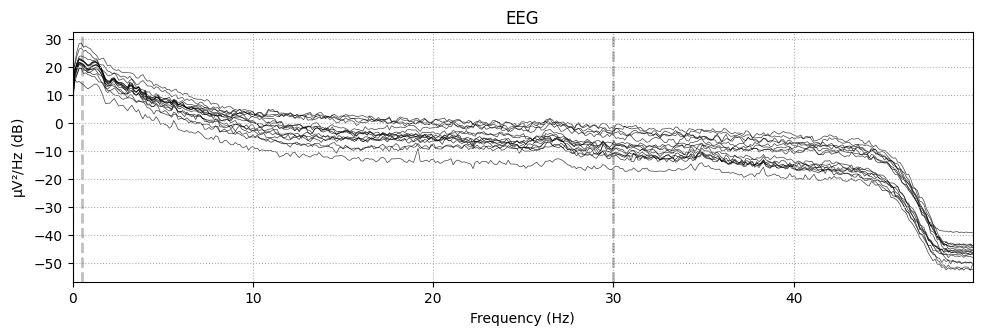

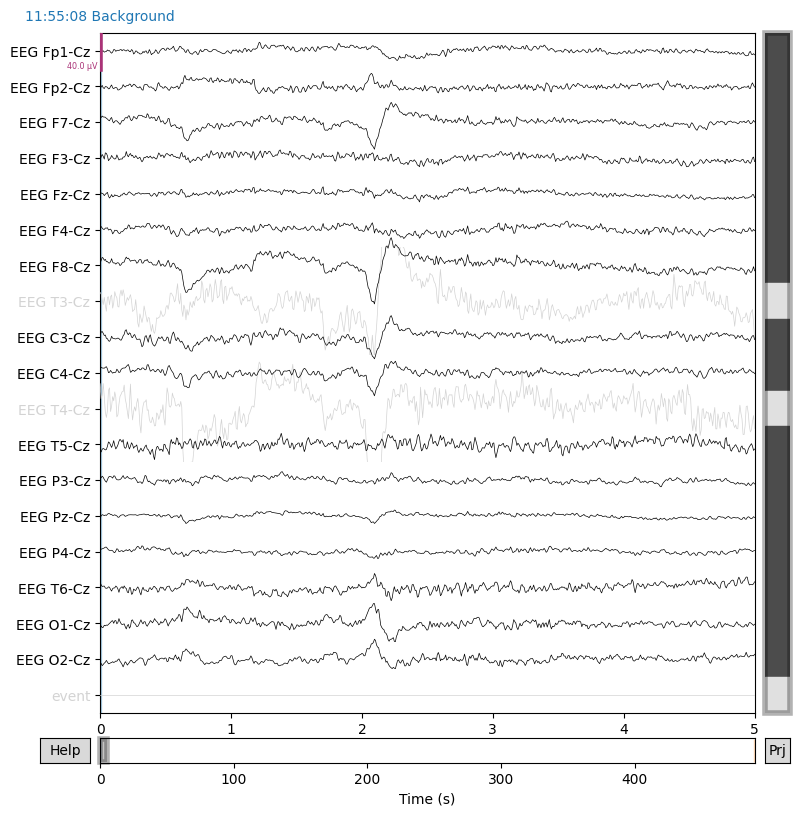

In [ ]:
import zipfile
import os

# List of volunteers
volunteers = ['TarasovHermanDay2Music.zip',
              'SimViolettaDay1Music.zip',
              'RamievTimurDay1Music.zip',
              'GolovinAlexanderDay2Music.zip']

# List of tasks
tasks = ['Task1_Processed_raw.fif', 'Task2_Processed_raw.fif', 'Task3_Processed_raw.fif', 'Task4_Processed_raw.fif']

# Base pat
base_path = './Data/SampleData/'

# Iterate through volunteers and tasks
for volunteer_zip in volunteers:
    # Construct the zip file path
    zip_path = base_path + volunteer_zip

    # Unzip the folder
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(base_path)

    # Get the volunteer folder name
    volunteer_folder = volunteer_zip[:-4]

    for task in tasks:
        # Construct the file path
        file_path = base_path + volunteer_folder + '/' + task

        # Read the raw data
        raw = mne.io.read_raw_fif(file_path)

        # # Print raw data and info
        # print(raw)
        # print(raw.info)

        # Compute and plot
        raw.compute_psd(fmax=50).plot(picks="data", exclude="bads")

        # Plot the raw data
        raw.plot(duration=5, n_channels=30)


Extracting EDF parameters from /content/Data/SampleData/TarasovHermanDay2Music/Task1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


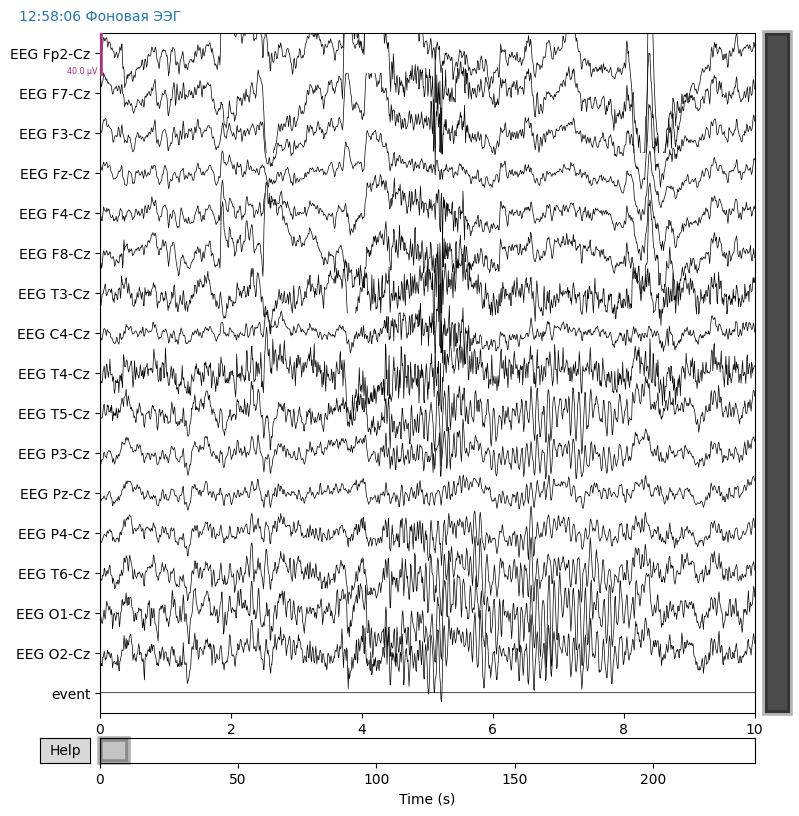

Extracting EDF parameters from /content/Data/SampleData/TarasovHermanDay2Music/Task2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


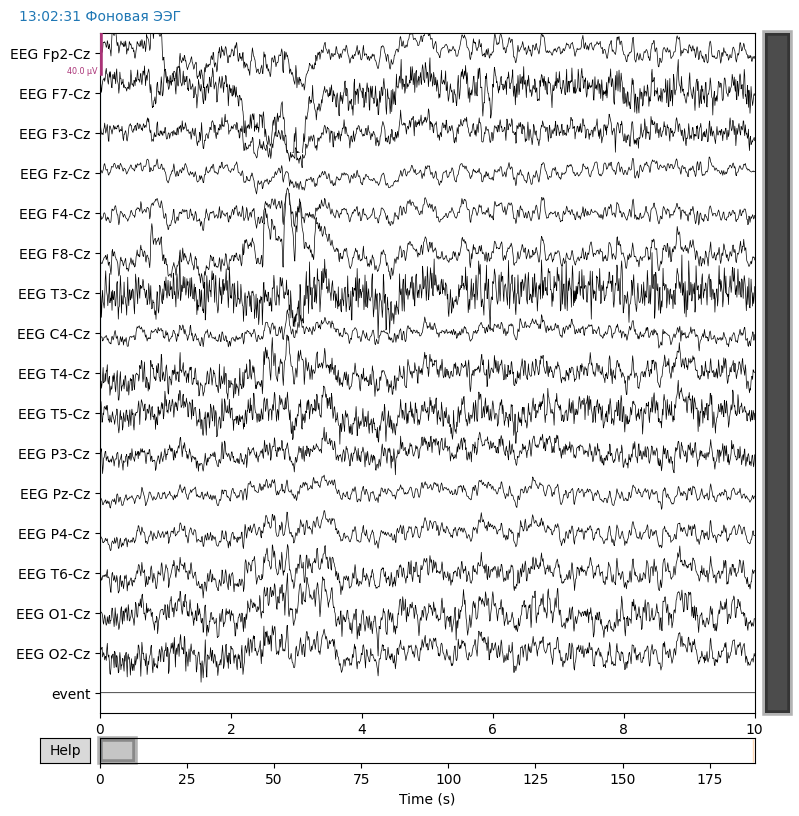

Extracting EDF parameters from /content/Data/SampleData/TarasovHermanDay2Music/Task3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


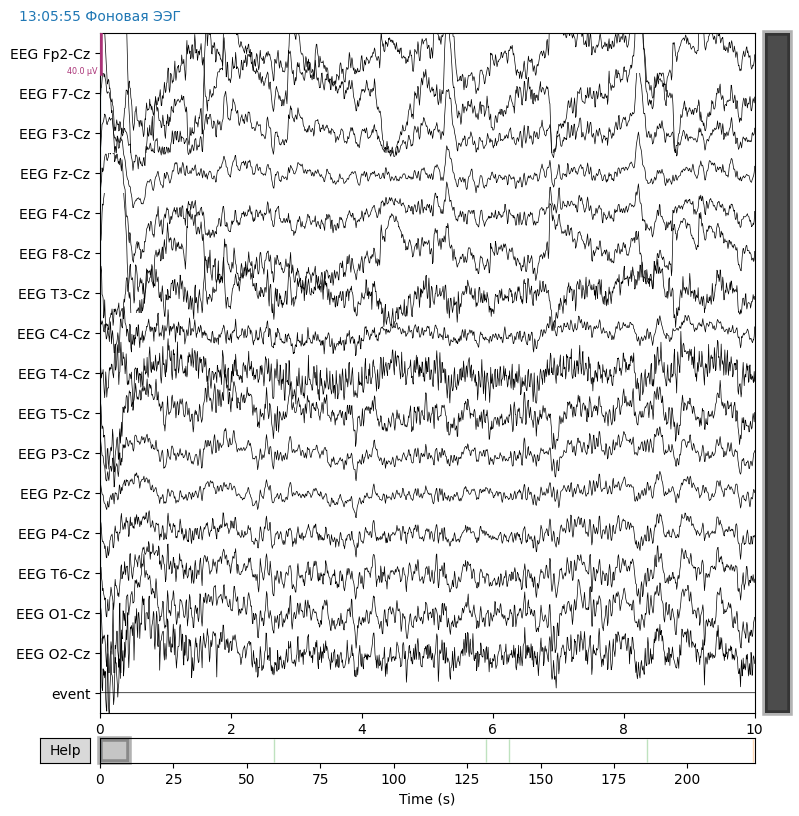

Extracting EDF parameters from /content/Data/SampleData/TarasovHermanDay2Music/Task4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


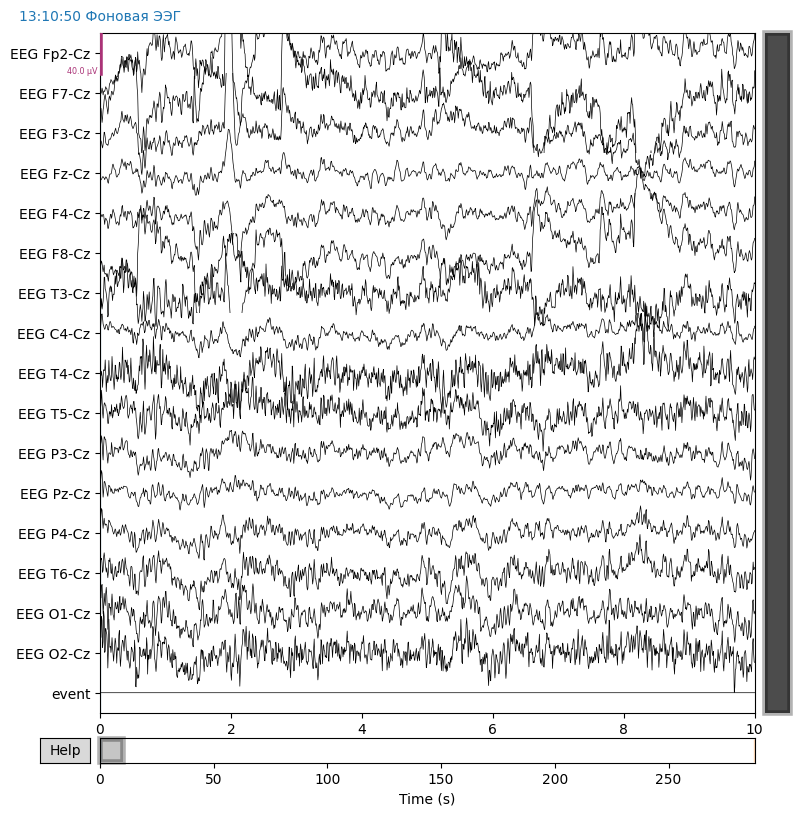

Extracting EDF parameters from /content/Data/SampleData/SimViolettaDay1Music/Task1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


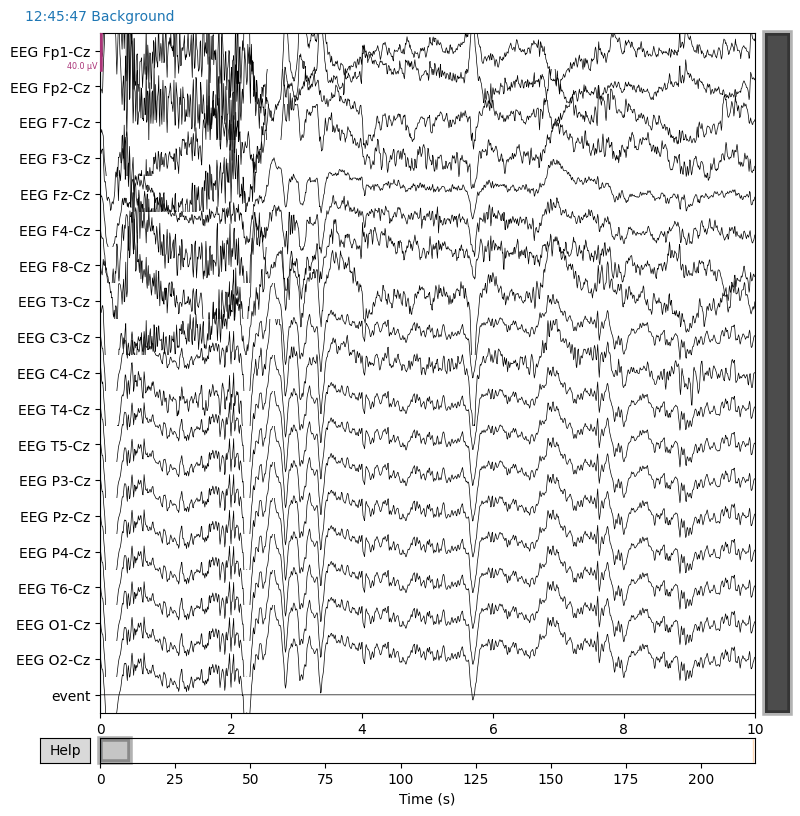

Extracting EDF parameters from /content/Data/SampleData/SimViolettaDay1Music/Task2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


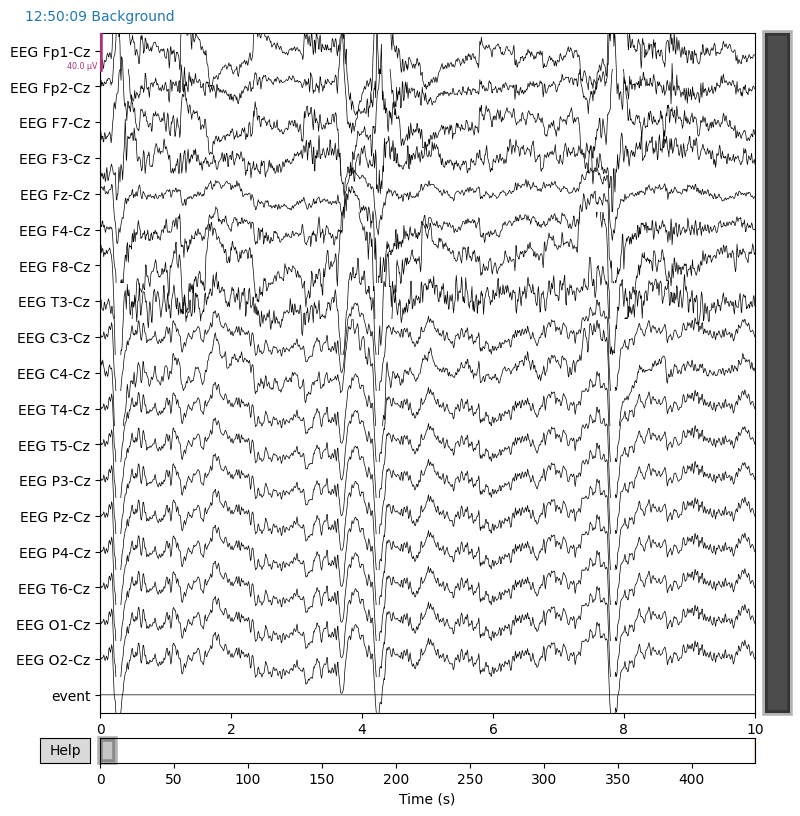

Extracting EDF parameters from /content/Data/SampleData/SimViolettaDay1Music/Task3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


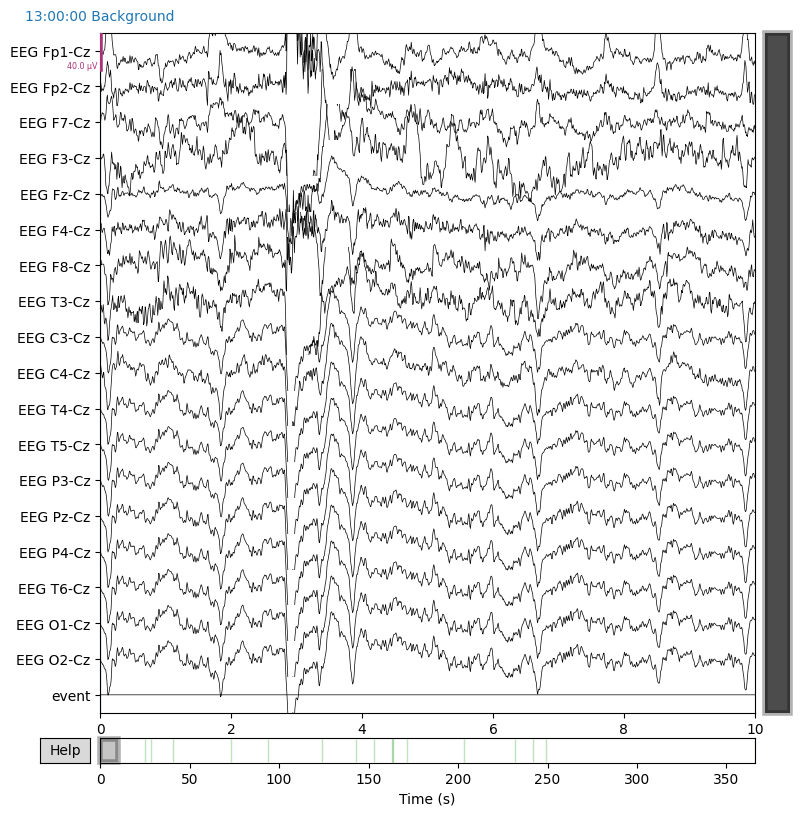

Extracting EDF parameters from /content/Data/SampleData/SimViolettaDay1Music/Task4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


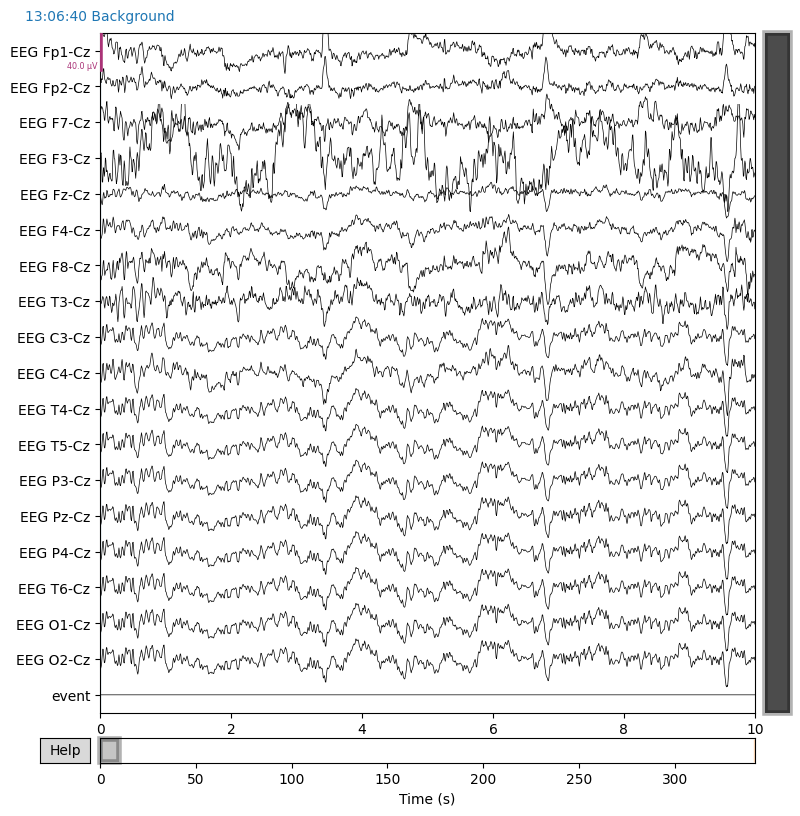

Extracting EDF parameters from /content/Data/SampleData/RamievTimurDay1Music/Task1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


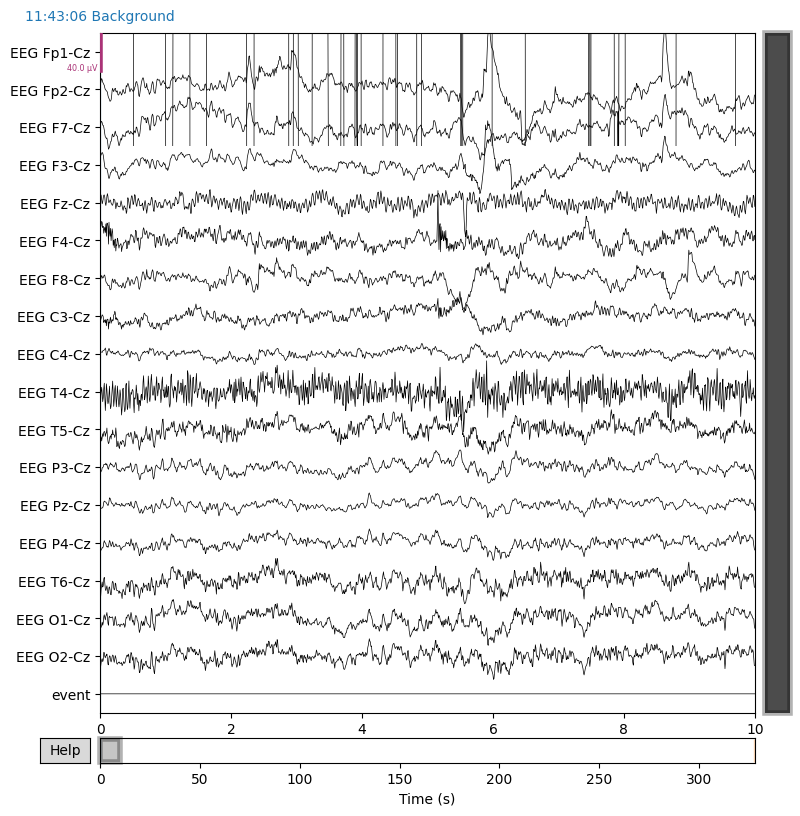

Extracting EDF parameters from /content/Data/SampleData/RamievTimurDay1Music/Task2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


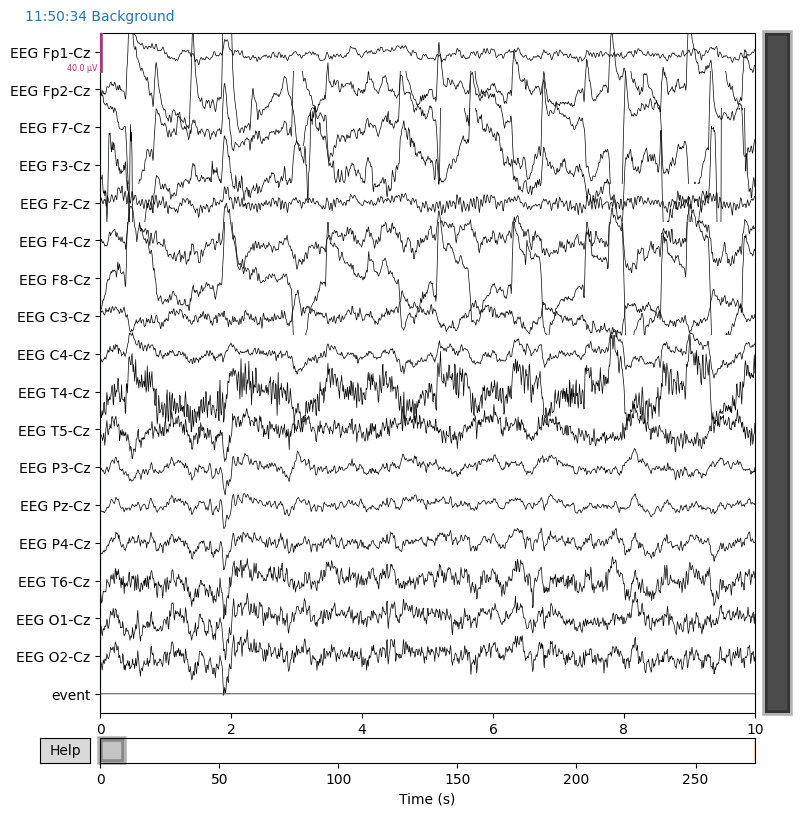

Extracting EDF parameters from /content/Data/SampleData/RamievTimurDay1Music/Task3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


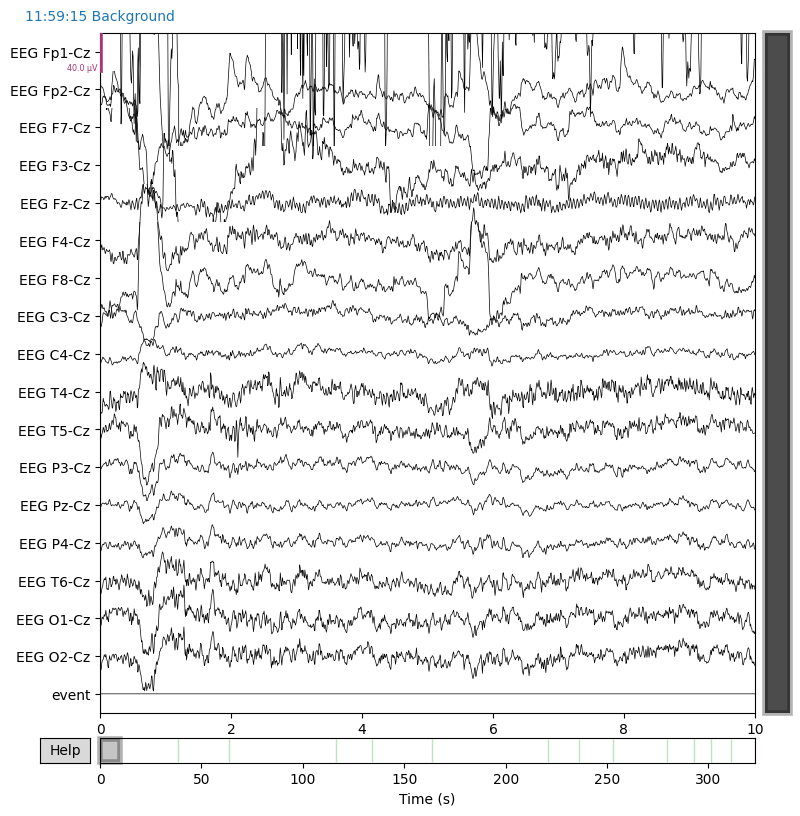

Extracting EDF parameters from /content/Data/SampleData/RamievTimurDay1Music/Task4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


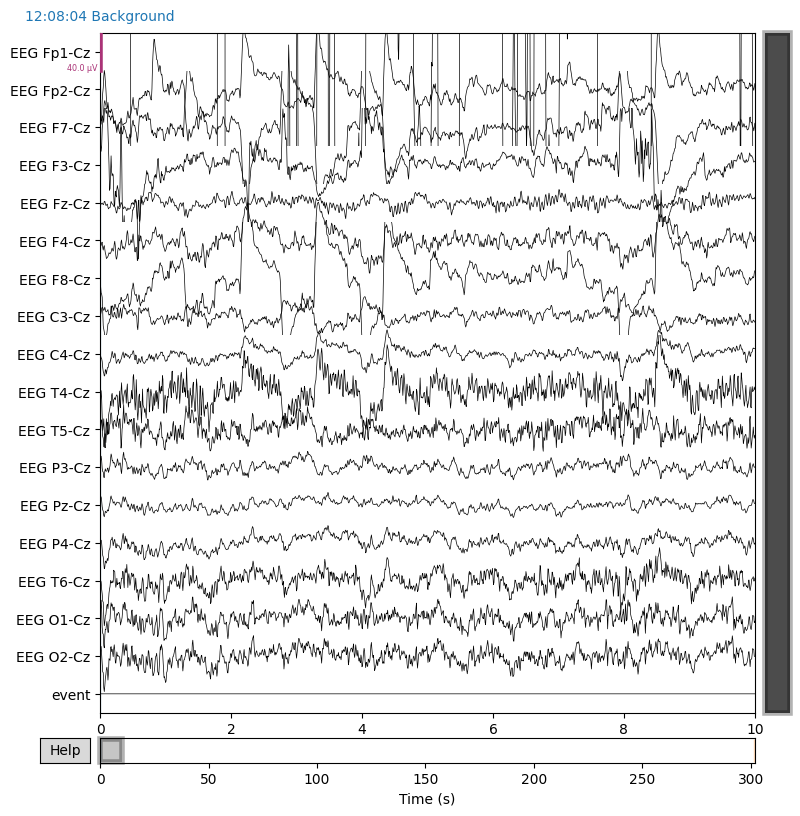

Extracting EDF parameters from /content/Data/SampleData/GolovinAlexanderDay2Music/Task1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


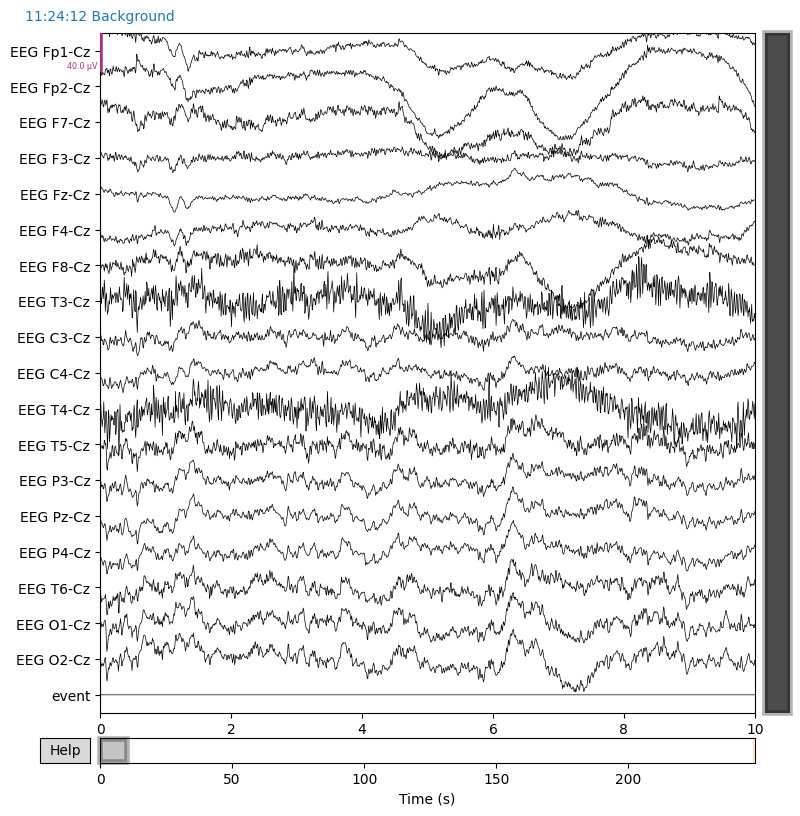

Extracting EDF parameters from /content/Data/SampleData/GolovinAlexanderDay2Music/Task2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


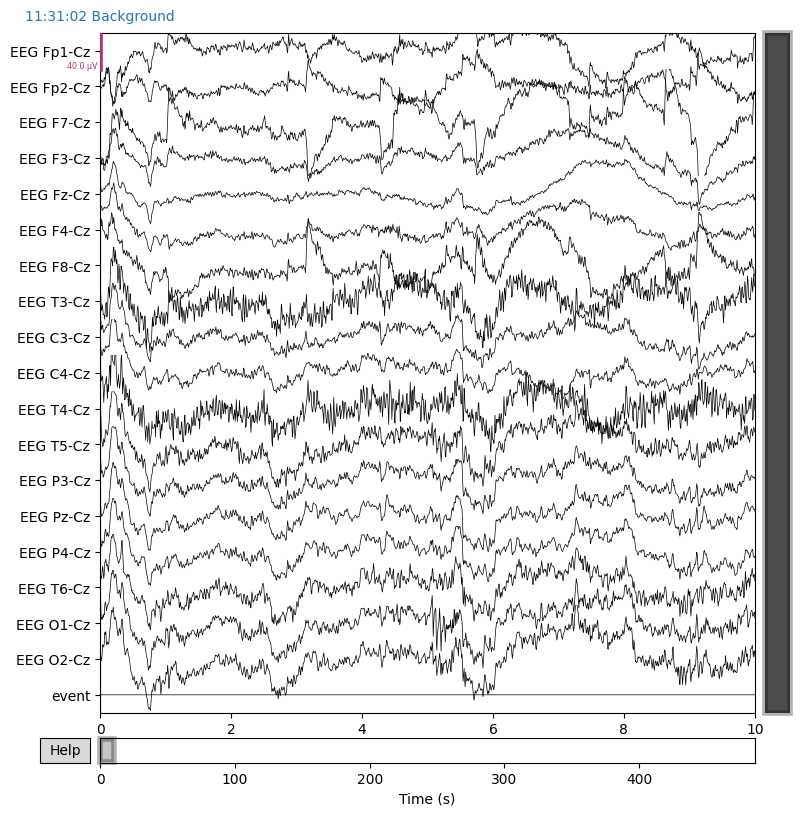

Extracting EDF parameters from /content/Data/SampleData/GolovinAlexanderDay2Music/Task3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


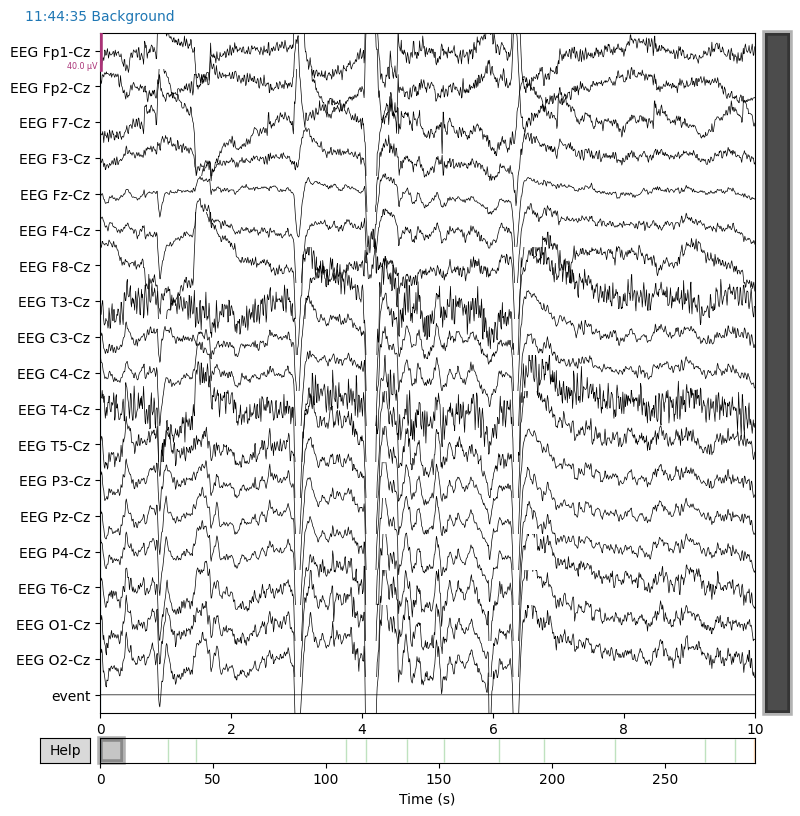

Extracting EDF parameters from /content/Data/SampleData/GolovinAlexanderDay2Music/Task4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


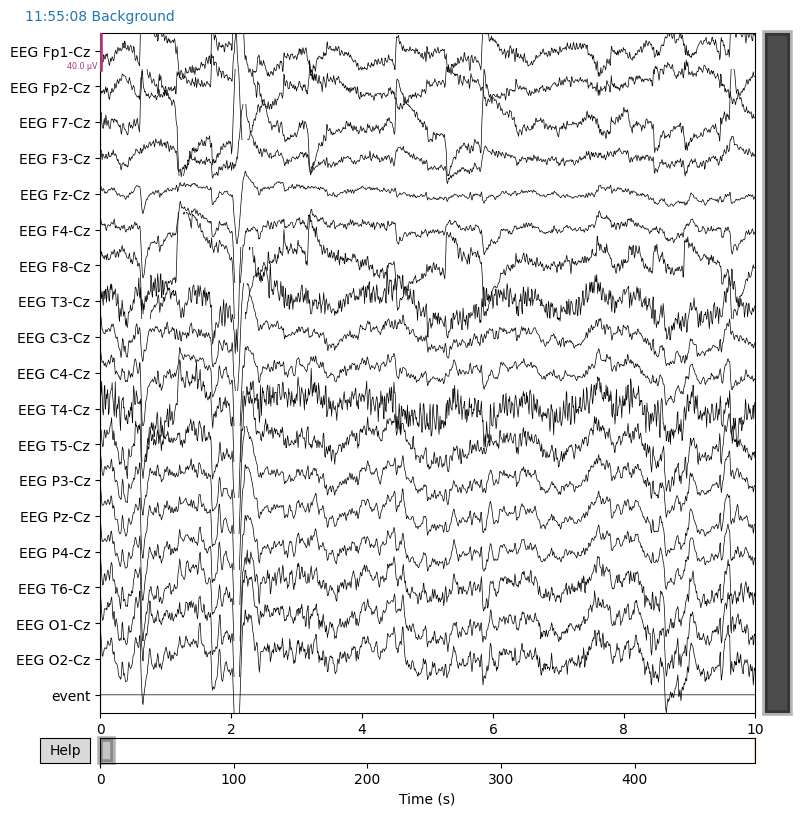

In [ ]:
import os

# List of volunteers
volunteers = ['TarasovHermanDay2Music',
              'SimViolettaDay1Music',
              'RamievTimurDay1Music',
              'GolovinAlexanderDay2Music']

# List of tasks
tasks = ['Task1.edf', 'Task2.edf', 'Task3.edf', 'Task4.edf']

# Base path
base_path = './Data/SampleData/'

# Iterate through volunteers and tasks
for volunteer in volunteers:
    for task in tasks:
        # Construct the file path
        file_path = os.path.join(base_path, volunteer, task)

        # Importing Data
        EDF_Object = mne.io.read_raw_edf(file_path)

        # Extracting Channels' Names
        Ch_Names = EDF_Object.ch_names

        # Extracting Channels' Data
        Ch_Data = EDF_Object.get_data(picks="all")

        # Extracting Information
        Info = EDF_Object.info

        # Sampling Frequency
        sfreq = Info["sfreq"]

        # Data Plotting
        EDF_Object.plot()


In [ ]:
import os

def process_edf(file_path, bad_channels, ecg_eog_channel, age):
    data_path = './Data/SampleData/'

    electrodes = {"central": ['EEG F3-Cz', 'EEG F4-Cz', 'EEG Fz-Cz', 'EEG C3-Cz', 'EEG C4-Cz', 'EEG P3-Cz', 'EEG P4-Cz',
                            'EEG Pz-Cz'],
                "frontal": ['EEG Fp2-Cz', 'EEG F7-Cz', 'EEG F3-Cz', 'EEG Fz-Cz', 'EEG F4-Cz', 'EEG F8-Cz'],
                "temporal": ['EEG T3-Cz', 'EEG T4-Cz', 'EEG T5-Cz', 'EEG T6-Cz']}

    WAVES = ["L1A", "L2A", "UA", "Th"]

    raw_exp = mne.io.read_raw_edf(file_path, preload=True)

    # Mark bad channels
    raw_exp.info['bads'] = [raw_exp.ch_names[ch] for ch in bad_channels]

    sfreq = raw_exp.info['sfreq']

    # Select the electrodes of interest
    experiment = raw_exp.copy().pick_channels(ch_names=electrodes["frontal"])

    print(raw_exp.ch_names)

    # Removing noise
    experiment_filtered_data = mne.filter.notch_filter(x=experiment.get_data(), Fs=sfreq, freqs=[50, 100])
    experiment_filtered = mne.io.RawArray(data=experiment_filtered_data,
                                                info=mne.create_info(ch_names=electrodes["frontal"], sfreq=sfreq))

    experiment

    # Function to calculate IAF
    def IAF(age):
        return 11.95 - 0.053 * age

    IAF_p = IAF(age)

    experiment_sub_bands = {'L1A': mne.filter.filter_data(data=np.mean(experiment_filtered.get_data(), axis=0),
                                                                l_freq=IAF_p - 4, h_freq=IAF_p - 2, sfreq=sfreq,
                                                                method="fir", verbose=False),
                                    'L2A': mne.filter.filter_data(data=np.mean(experiment_filtered.get_data(), axis=0),
                                                                l_freq=IAF_p - 2, h_freq=IAF_p, sfreq=sfreq,
                                                                method="fir", verbose=False),
                                    'UA': mne.filter.filter_data(data=np.mean(experiment_filtered.get_data(), axis=0),
                                                                l_freq=IAF_p,
                                                                h_freq=IAF_p + 2, sfreq=sfreq, method="fir", verbose=False),
                                    'Th': mne.filter.filter_data(data=np.mean(experiment_filtered.get_data(), axis=0),
                                                                l_freq=IAF_p - 6, h_freq=IAF_p - 4, sfreq=sfreq,
                                                                method="fir", verbose=False),
                                    'Beta': mne.filter.filter_data(data=np.mean(experiment_filtered.get_data(), axis=0),
                                                                l_freq=IAF_p + 2, h_freq=30, sfreq=sfreq,
                                                                method="fir", verbose=False)}

    # Function to calculate ERD
    def erd_calculation(amp_rest, amp_task):
        erd = (amp_rest - amp_task) / amp_task * 100
        return erd

    fft = {}
    from scipy.signal import stft
    window = sfreq * 2

    for band in WAVES:
        fft[band] = stft(x=experiment_sub_bands[band], fs=sfreq, window=('kaiser', window), nperseg=1000)

    erd_calc = np.vectorize(erd_calculation)

    results = {}
    results["ABratio"] = remove_outliers(np.real(np.power(experiment_sub_bands["UA"] / experiment_sub_bands["Beta"], 2)))
    return results

# Dictionary to store the results for each file
all_results = {}

# List of volunteers
volunteers = ['TarasovHermanDay2Music',
              'SimViolettaDay1Music',
              'RamievTimurDay1Music',
              'GolovinAlexanderDay2Music']

# List of tasks
tasks = ['Task1.edf', 'Task2.edf', 'Task3.edf', 'Task4.edf']


ages = {
    'GolovinAlexanderDay2Music': 21,
    'TarasovHermanDay2Music': 23,
    'SimViolettaDay1Music': 22,
    'RamievTimurDay1Music': 21
}


# Base path
base_path = './Data/SampleData/'

channel_info = {
    'GolovinAlexanderDay2Music': {
        'Task1.edf': {'bad_channels': [7, 10, 18], 'ecg_eog_channel': 1},
        'Task2.edf': {'bad_channels': [7, 10, 18], 'ecg_eog_channel': 2},
        'Task3.edf': {'bad_channels': [7, 10, 18], 'ecg_eog_channel': 1},
        'Task4.edf': {'bad_channels': [7, 10, 18], 'ecg_eog_channel': 2},
    },
    'TarasovHermanDay2Music': {
        'Task1.edf': {'bad_channels': [16], 'ecg_eog_channel': 5},
        'Task2.edf': {'bad_channels': [16], 'ecg_eog_channel': 5},
        'Task3.edf': {'bad_channels': [15, 16], 'ecg_eog_channel': 0},
        'Task4.edf': {'bad_channels': [16], 'ecg_eog_channel': 1},
    },
    'SimViolettaDay1Music': {
        'Task1.edf': {'bad_channels': [0, 1, 18], 'ecg_eog_channel': 2},
        'Task2.edf': {'bad_channels': [18], 'ecg_eog_channel': 3},
        'Task3.edf': {'bad_channels': [18], 'ecg_eog_channel': 1},
        'Task4.edf': {'bad_channels': [18], 'ecg_eog_channel': 1},
    },
    'RamievTimurDay1Music': {
        'Task1.edf': {'bad_channels': [0, 17], 'ecg_eog_channel': 1},
        'Task2.edf': {'bad_channels': [1, 17], 'ecg_eog_channel': 2},
        'Task3.edf': {'bad_channels': [0, 17], 'ecg_eog_channel': 1},
        'Task4.edf': {'bad_channels': [0, 17], 'ecg_eog_channel': 1},
    }
}

# Iterate through volunteers and tasks
for volunteer in volunteers:
    for task in tasks:
        # Construct the file path
        file_path = os.path.join(base_path, volunteer, task)

        # Get the bad channels and ECG & EOG channel for this volunteer and task
        bad_channels = channel_info[volunteer][task]['bad_channels']
        ecg_eog_channel = channel_info[volunteer][task]['ecg_eog_channel']

        age = ages[volunteer]

        # Process the EDF file
        results = process_edf(file_path, bad_channels, ecg_eog_channel, age)

        # Store the results
        file_name = file_path.split('/')[-1]  # Extract the file name from the path
        all_results[file_name] = results

Extracting EDF parameters from /content/Data/SampleData/TarasovHermanDay2Music/Task1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 59249  =      0.000 ...   236.996 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
['EEG Fp2-Cz', 'EEG F7-Cz', 'EEG F3-Cz', 'EEG Fz-Cz', 'EEG F4-Cz', 'EEG F8-Cz', 'EEG T3-Cz', 'EEG C4-Cz', 'EEG T4-Cz', 'EEG T5-Cz', 'EEG P3-Cz', 'EEG Pz-Cz', 'EEG P4-Cz', 'EEG T6-Cz', 'EEG O1-Cz', 'EEG O2-Cz', 'event']
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 1651 samples (6.604 s)

Creating RawArray with float64 data, n_channels=6, n_times=59250
    Range : 0 ... 59249 =      

<ipython-input-16-f3e72610e8af>:69: RuntimeWarning: divide by zero encountered in divide
  results["ABratio"] = remove_outliers(np.real(np.power(experiment_sub_bands["UA"] / experiment_sub_bands["Beta"], 2)))


Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 61999  =      0.000 ...   247.996 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
['EEG Fp1-Cz', 'EEG Fp2-Cz', 'EEG F7-Cz', 'EEG F3-Cz', 'EEG Fz-Cz', 'EEG F4-Cz', 'EEG F8-Cz', 'EEG T3-Cz', 'EEG C3-Cz', 'EEG C4-Cz', 'EEG T4-Cz', 'EEG T5-Cz', 'EEG P3-Cz', 'EEG Pz-Cz', 'EEG P4-Cz', 'EEG T6-Cz', 'EEG O1-Cz', 'EEG O2-Cz', 'event']
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 1651 samples (6.604 s)

Creating RawArray with float64 data, n_channels=6, n_times=62000
    Range : 0 ... 61999 =      0.000 ...   247.996 secs
Ready.
Extracting EDF parameters from /content/Data/Sample

In [ ]:
# features and labels
features = []
labels = []

for file_name, result in all_results.items():
    feature_vector = [np.mean(result["ABratio"])]
    label = 0  # Define the label for this file based on your specific task
    features.append(feature_vector)
    labels.append(label)

In [ ]:
from sklearn.model_selection import train_test_split

features = np.array(features)
labels = np.array(labels)

# Split into training and temporary sets
X_train, X_temp, y_train, y_temp = train_test_split(features, labels, test_size=0.4, random_state=42)

# Split the temporary set into validation and test sets
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


Epoch 1/10
1/1 [==============================] - 3s 3s/step - loss: 0.6379 - accuracy: 1.0000 - val_loss: 0.6395 - val_accuracy: 1.0000
Epoch 2/10
1/1 [==============================] - 0s 79ms/step - loss: 0.6496 - accuracy: 0.5000 - val_loss: 0.6359 - val_accuracy: 1.0000
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 0.6347 - accuracy: 1.0000 - val_loss: 0.6321 - val_accuracy: 1.0000
Epoch 4/10
1/1 [==============================] - 0s 64ms/step - loss: 0.6381 - accuracy: 1.0000 - val_loss: 0.6283 - val_accuracy: 1.0000
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 0.6296 - accuracy: 1.0000 - val_loss: 0.6245 - val_accuracy: 1.0000
Epoch 6/10
1/1 [==============================] - 0s 73ms/step - loss: 0.6346 - accuracy: 1.0000 - val_loss: 0.6207 - val_accuracy: 1.0000
Epoch 7/10
1/1 [==============================] - 0s 69ms/step - loss: 0.5896 - accuracy: 1.0000 - val_loss: 0.6169 - val_accuracy: 1.0000
Epoch 8/10
1/1 [=============

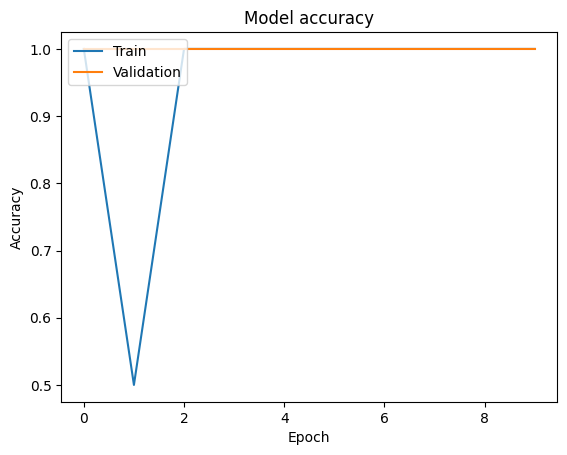

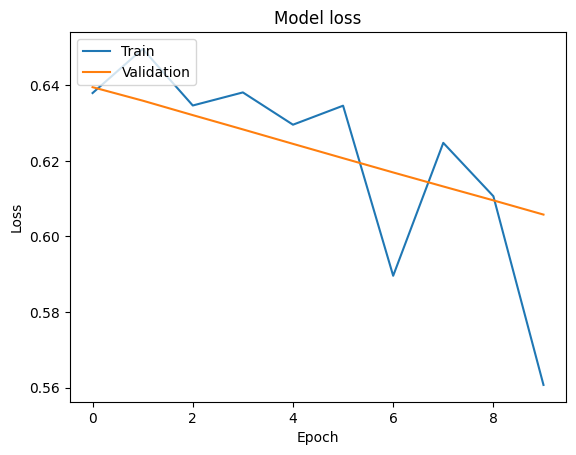

In [ ]:
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from keras.optimizers import Adam
import matplotlib.pyplot as plt

input_shape = (1, 1)

# Define the model
model = Sequential()
model.add(Flatten(input_shape=input_shape)) # Flattened input
model.add(Dense(50, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid')) # Binary classification

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print("Accuracy: {:.2f}%".format(accuracy * 100))

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
